# High Mountain Asia UCLA Daily Snow Reanalysis, Version 1

https://nsidc.org/data/HMA_SR_D

Snowpack plays a significant role in the hydrologic cycle over High Mountain Asia (HMA). As a vital water resource, the distribution of snowpack volume also impacts the water availability for downstream populations. To assess the regional water balance, it is important to characterize the spatio-temporal distribution of water storage in the HMA snowpack.
This HMA snow reanalysis data set contains daily estimates of posterior snow water equivalent (SWE), fractional snow covered area (fSCA), snow depth (SD), etc.

| Parameter(s):        | SNOW/ICE > ALBEDOSNOW/ICE > SNOW DEPTHSNOW/ICE > SNOW MELTSNOW/ICE > SNOW WATER EQUIVALENTSNOW/ICE > SNOW VOLUME BUDGET > SUBLIMATION | Data Format(s): | NetCDF                                                       |
| -------------------- | ------------------------------------------------------------ | --------------- | ------------------------------------------------------------ |
| Spatial Coverage:    | N: 45, S: 27, E: 105, W: 60                                  | Platform(s):    | LANDSAT-5, LANDSAT-7, LANDSAT-8, Terra                       |
| Spatial Resolution:  | 16 arc-seconds x 16 arc-seconds                              | Sensor(s):      | ETM+, MODIS, OLI, TM                                         |
| Temporal Coverage:   | 1 October 1999 to 30 September 2017                          | Version(s):     | V1                                                           |
| Temporal Resolution  | 1 day                                                        | Metadata XML:   | [View Metadata Record](https://nsidc.org/api/dataset/metadata/v2/oai?verb=GetRecord&metadataPrefix=dif&identifier=HMA_SR_D.001) |
| Data Contributor(s): | Liu, Y., Y. Fang, and S. A. Margulis.                        |                 |                                                              |



## Citation

Liu, Y., Y. Fang, and S. A. Margulis. 2021. *High Mountain Asia UCLA Daily Snow Reanalysis, Version 1*. [Indicate subset used]. Boulder, Colorado USA. NASA National Snow and Ice Data Center Distributed Active Archive Center. doi: https://doi.org/10.5067/HNAUGJQXSCVU. Accessed October 18, 2021.

[Indicate subset used]: This field is for temporal or spatial coverage of the data used. It is necessary to enable a micro-citation or the ability to refer to the specific data used—the exact files, granules, records, etc. For example, March to June 2004, or 84°N, 75°W; 44°N, 10°W. (https://nsidc.org/about/use_copyright.html)

## Paper

Liu, Y., Fang, Y., & Margulis, S. A. (2021). Spatiotemporal distribution of seasonal snow water equivalent in High Mountain Asia from an 18-year Landsat–MODIS era snow reanalysis dataset. The Cryosphere, 15(11), 5261–5280. https://doi.org/10.5194/tc-15-5261-2021

## Download

18 October 2021 by Mickaël Lalande (mickael.lalande@univ-grenoble-alpes.fr)

### Download procedure

I used the Python script in `nsidc-download_HMA_SR_D.001_2021-10-18.py`. However, due to the large volume of data, I split the downloads by years.  The data being by *water year* (WY) from October 1st to September 31st of the following year, the Python script recognizes by default 2 years for each year entered. So, I entered a classical year, for example: from 2000-01-01 to 2000-12-31, which downloads the two WY: WY1999_00 and WY2000_01 (what matters is the year, ex: 2000-01-01 to 2000-01-01 works too) . Otherwise if you put the WY from 2000-10-01 to 2001-09-30, for example, it will recognize 3 WY: WY1999_00, WY2000_01 and WY2001_02. It's a bit of a headache, but it allows at least to make grouped downloads by 2 years. So I copied the Python script `nsidc-download_HMA_SR_D.001_2021-10-18.py` in the sub-folders `WYXXXX_XX` of one year on two (by modifying the `time_start` and the `time_end`) and I then copied the WY in the corresponding folders.

There are 523 files per WY and per variable (total 4184 files), corresponding in total to ~180GB.

Update: since python scripts are really slow, I finally made some file requests via the web interface and clicked on `order files`. I then retrieved the text file that lists all the files (e.g. `nsidc-download_64e56cee.txt`) and used the command `cat nsidc-download_64e56cee.txt | xargs -n 20 -P 8 wget -q` which allows to download the files in parallel (https://stackoverflow.com/questions/7577615/parallel-wget-in-bash / https://stackoverflow.com/questions/55846694/parallel-wget-download-url-list-and-rename)

PS: you need an account on https://urs.earthdata.nasa.gov/

## Folders

The raw files are in the folder `HMA_SR_D` and then stored per water year (WY) starting from October 1st and ending the following year on September 31st.

### HMA_SR_xxkm

Permanent snow is not taken into account when spatially aggregated (because of SD and SWE drift over permanent snow areas). We suggest to remove areas with more than 10% of permanent snow for analyses. (See: https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/2_calibration/HMASR_SCF_100km_drift.ipynb and https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMASR_monthly-Copy1.ipynb)

- `HMA_SR_100km` are aggregated files over a full tile of 1° (`ds.coarsen(Latitude=225, Longitude=225).mean()`)  -> https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMA_SR_100km_mask.ipynb

Coordinates are slightly modified for easier further manipulation:

```python
ds = ds.assign_coords(Day=pd.date_range(start=WY[2:6]+'-10-01', periods=ds.Day.size, freq='D'))
ds = ds.rename({'Longitude': 'lon', 'Latitude': 'lat', 'Day': 'time'}).transpose("Stats", "time", "lat", "lon")
ds['lat'] = np.round(ds.lat, 1) ; ds['lon'] = np.round(ds.lon, 1)
```

Only mean is taken: 

> The ensemble statistics are given in the order of: ensemble mean, ensemble standard deviation, ensemble median, 25th percentile, and 75th percentile.

```python
ds.isel(Stats=0)
```



### HMASR_100km (test)

Be careful as permanent snow has drift (snow depth and SWE)... so it is not directly usable.

- `HMASR_100km` are aggregated files over a full tile of 1° (averaged) -> check https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMASR_100km.ipynb (all files are in WY folders and there are spatially combined in the outside of folders to make it easier to read)
- `HMASR_100km_mask` same as `HMASR_100km` but only for SCF to test with permanent snow areas masked. It gives same results as [Liu et al. (2021)](https://doi.org/10.5194/tc-15-5261-2021) Figure 7 (See: https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMASR_monthly-Copy1.ipynb). 

### HMA_SR_M (for plots -> 5km monthly)

- `HMA_SR_M` are monthly files degraded to 5km (to make plots easier)
- `HMA_SR_M_combined` same as `HMA_SR_M` but spatially combined

In [2]:
# To reload external files automatically (ex: utils)
# phd_v3 env
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
# sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
sys.path.insert(1, '../utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]


In [7]:
xr.show_versions()


INSTALLED VERSIONS
------------------
commit: None
python: 3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]
python-bits: 64
OS: Linux
OS-release: 4.19.0-18-amd64
machine: x86_64
processor: 
byteorder: little
LC_ALL: None
LANG: fr_FR.UTF-8
LOCALE: fr_FR.UTF-8
libhdf5: 1.10.6
libnetcdf: 4.7.4

xarray: 0.16.0
pandas: 1.1.0
numpy: 1.19.1
scipy: 1.5.2
netCDF4: 1.5.4
pydap: None
h5netcdf: None
h5py: None
Nio: None
zarr: 2.4.0
cftime: 1.2.1
nc_time_axis: 1.2.0
PseudoNetCDF: None
rasterio: 1.1.5
cfgrib: 0.9.8.5
iris: None
bottleneck: None
dask: 2.21.0
distributed: 2.21.0
matplotlib: 3.2.0
cartopy: 0.17.0
seaborn: 0.11.2
numbagg: None
pint: None
setuptools: 49.2.0.post20200712
pip: 20.2
conda: None
pytest: 6.0.0
IPython: 7.16.1
sphinx: None


/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/setuptools/distutils_patch.py:25: UserWarning: Distutils was imported before Setuptools. This usage is discouraged and may exhibit undesirable behaviors or errors. Please use Setuptools' objects directly or at least import Setuptools first.
  warnings.warn(


In [8]:
plot.version

'0.6.4'

## Create non seasonal snow mask

In [ ]:
# # For parallelisation
# from dask.distributed import Client
# client = Client(n_workers=4, threads_per_worker=3, memory_limit='6GB')
# # client = Client()
# client

In [96]:
# client.close()

In [54]:
# path='/mnt/lalandmi/equipes/C2H/HMASR/HMA_SR_D/WY1999_00/'
# ds = xr.open_mfdataset(path+'HMA_SR_D_v01_*_agg_16_WY1999_00_MASK.nc').Non_seasonal_snow_mask
# permanent_snow_count = ds.coarsen(Latitude=225, Longitude=225).sum().load()
# permanent_snow_count = permanent_snow_count.rename({'Longitude': 'lon', 'Latitude': 'lat'}).transpose("lat", "lon")
# permanent_snow_count['lat'] = np.round(permanent_snow_count.lat, 1) ; permanent_snow_count['lon'] = np.round(permanent_snow_count.lon, 1)
# mask_psnow = (permanent_snow_count/(225*225)*100)
# mask_psnow.name = 'Non_seasonal_snow_mask'
# mask_psnow.attrs['units'] = '%'
# mask_psnow.to_netcdf('Non_seasonal_snow_mask_100km.nc')

## Aggregate elevation file

In [49]:
# path='/mnt/lalandmi/equipes/C2H/HMASR/HMASR_DEM_DATA/'
# hmasr_topo = xr.open_mfdataset(path+'*.nc', combine='by_coords', parallel=True).elevation \
#                 .rename({'Longitude': 'lon', 'Latitude': 'lat'}).transpose("lat", "lon").load()

# path='/mnt/lalandmi/equipes/C2H/HMASR/HMA_SR_D/WY1999_00/'
# mask = xr.open_mfdataset(path+'HMA_SR_D_v01_*_agg_16_WY1999_00_MASK.nc', parallel=True).Non_seasonal_snow_mask \
#             .rename({'Longitude': 'lon', 'Latitude': 'lat'}).transpose("lat", "lon").load()

In [61]:
# hmasr_mean_topo_1deg_seassnow = hmasr_topo.where(mask == 0).coarsen(lat=225, lon=225).mean()
# hmasr_std_topo_1deg_seassnow = hmasr_topo.where(mask == 0).coarsen(lat=225, lon=225).std()
# hmasr_mean_topo_1deg = hmasr_topo.coarsen(lat=225, lon=225).mean()
# hmasr_std_topo_1deg = hmasr_topo.coarsen(lat=225, lon=225).std()

# hmasr_mean_topo_1deg_seassnow.name = 'elevation_seassnow'
# hmasr_std_topo_1deg_seassnow.name = 'std_seassnow'
# hmasr_mean_topo_1deg.name = 'elevation'
# hmasr_std_topo_1deg.name = 'std'

# ds = xr.merge([hmasr_mean_topo_1deg_seassnow, hmasr_std_topo_1deg_seassnow, hmasr_mean_topo_1deg, hmasr_std_topo_1deg])
# ds['lat'] = np.round(ds.lat, 1) ; ds['lon'] = np.round(ds.lon, 1)
# ds.to_netcdf('../data/HMASR_DEM_100km.nc')

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


## Load data

In [3]:
path = '/mnt/lalandmi/equipes/C2H/HMASR/HMA_SR_100km/'

# Snow depth
ds = xr.open_mfdataset(path+'HMA_SR_D_v01_100km_WY*_SD_POST.nc')
sd = ds.SD_Post.load()

# SCF
ds = xr.open_mfdataset(path+'HMA_SR_D_v01_100km_WY*_SWE_SCA_POST.nc')
swe = ds.SWE_Post.load()
scf= ds.SCA_Post.load()

# Mask
mask = xr.open_dataarray('Non_seasonal_snow_mask_100km.nc').load()

# Topo
latlim = slice(mask.lat.min().values.item(0)-0.5, mask.lat.max().values.item(0)+0.5)
lonlim = slice(mask.lon.min().values.item(0)-0.5, mask.lon.max().values.item(0)+0.5)

ds = xr.open_dataset('../data/HMASR_DEM_100km.nc')
topo = ds.elevation_seassnow.load()
topo_std = ds.std_seassnow.load()

train_period = slice('1999-10-01', '2013-09-30') # ~80%
val_period = slice('2013-10-01', '2017-09-30') # ~20%

## Plot

In [104]:
var_list = [topo, topo_std, swe.mean('time')*100, sd.mean('time')*100, scf.mean('time')*100]
cmap_list = ['Spectral_r', None, 'Blues', 'Blues', 'viridis']
levels_list = [plot.arange(0, 5500, 500), plot.arange(0, 2000, 200), plot.arange(0, 10, 1), plot.arange(0, 30, 3), plot.arange(0, 50, 5)]
extend_list = ['max']*5
label_list = ['Elevation [m]', 'STD of elevation [m]', 'SWE [cm]', 'SD [cm]', 'SCF [%]']

In [12]:
import matplotlib.patches as mpatches
import cartopy.crs as ccrs

mask_lats = []
mask_lons = []

threshold = 30

for lat in mask.lat.values:
    for lon in mask.lon.values:
        temp = mask.where(mask>threshold)*0+1
        if temp.sel(lat=lat, lon=lon) == 1:
            mask_lats.append(lat)
            mask_lons.append(lon)
            
def plot_hatches_mask(ax):
    for i in range(len(mask_lats)):
        ax.add_patch(
                mpatches.Rectangle(
                    xy=[mask_lons[i]-0.5, mask_lats[i]-0.5], width=1, height=1, transform=ccrs.PlateCarree(),
                    fill=False, zorder=10, color='black', linewidth=0, hatch='//////',
                )
            )

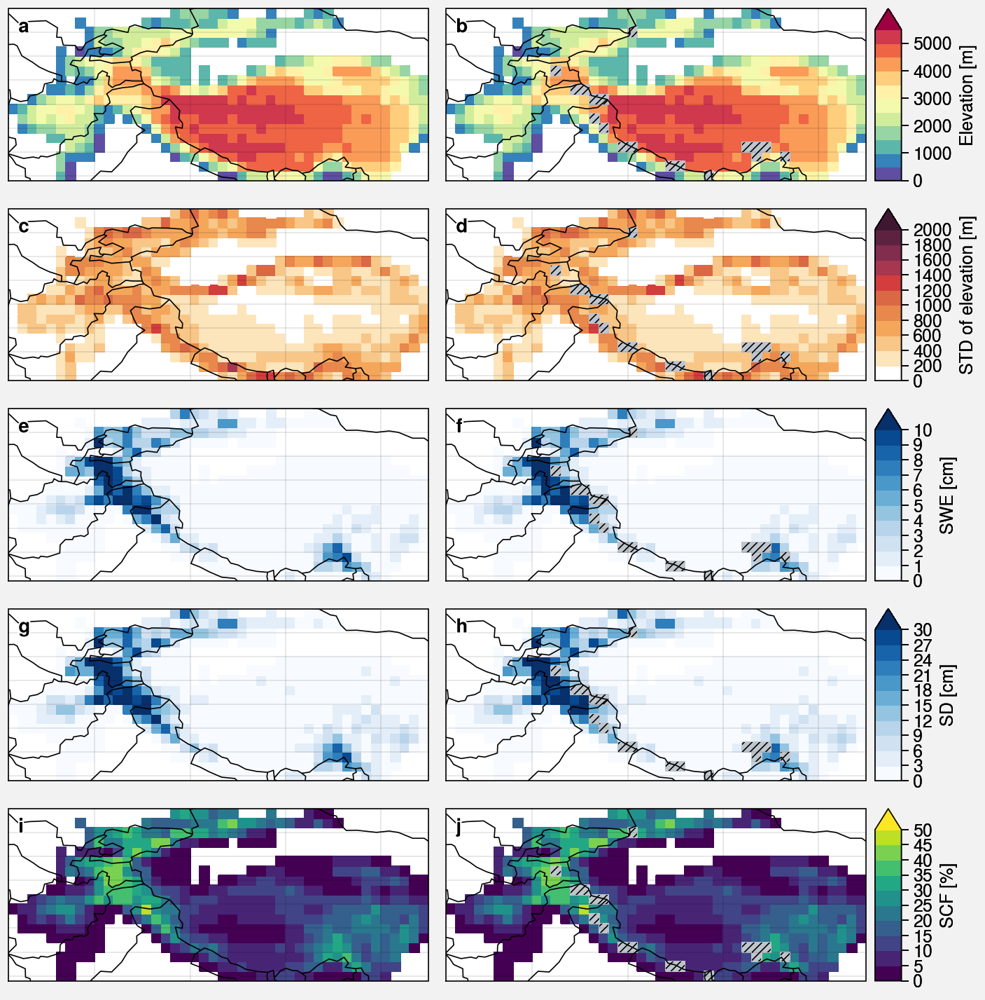

In [105]:
fig, axs = plot.subplots(proj='cyl', ncols=2, nrows=5, axwidth=3)

k = 0
threshold = 30 # percentage of permanent snow in a cell

for i in range(5):
    axs[i, 0].pcolormesh(var_list[i], cmap=cmap_list[i], levels=levels_list[i], extend=extend_list[i])

# With mask
for i in range(5):
    axs[i, 1].pcolormesh(
        var_list[i].where(mask<=threshold), cmap=cmap_list[i], levels=levels_list[i], extend=extend_list[i],
        colorbar='r', colorbar_kw={'label': label_list[i]}
    )
    axs[i, 1].pcolormesh(mask.where(mask>threshold)*0+1, cmap='gray6', levels=[0, 1, 2, 3])
    plot_hatches_mask(axs[i, 1])

# Format
axs.format(
    borders=True, labels=False, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    abc=True, abcloc='ul',
)

# fig.save('img/mask_variables.jpg')



## Check SCF/SWE relationship
### Influence of zones

In [4]:
# Get zone limits for annual cycle
lonlim_TS, latlim_TS, lonlim_HK, latlim_HK, lonlim_TP, latlim_TP, lonlim_HM, latlim_HM = u.get_zones()

# HMA for full domain and the following for the above zones
zones = ['HMA', 'TS', 'HK', 'TP', 'HM']
zones_df = pd.DataFrame(
    [[lonlim, latlim], [lonlim_TS, latlim_TS], [lonlim_HK, latlim_HK], [lonlim_TP, latlim_TP], [lonlim_HM, latlim_HM]], 
    columns=pd.Index(['lonlim', 'latlim'], name='Limits'),
    index=pd.Index(zones, name='Zones')
)

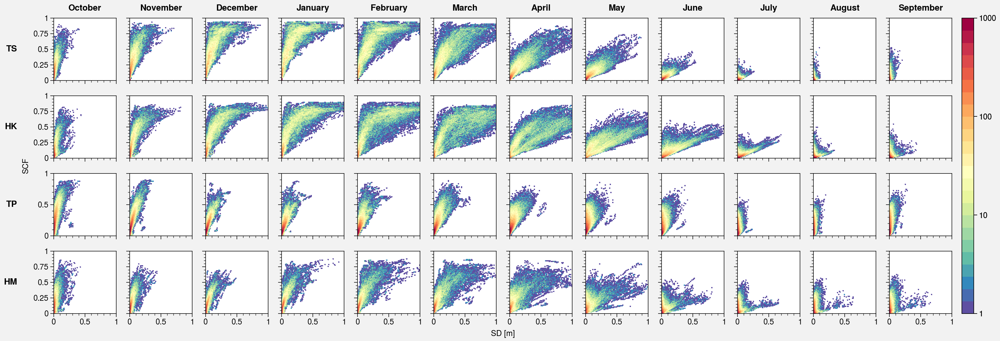

In [8]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9]
zones = ['TS', 'HK', 'TP', 'HM']

fig, axs = plot.subplots(ncols=len(months), nrows=4, axwidth=1)

for j, zone in enumerate(zones):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( (sd['time.month'] == month) & (mask < 30) ).values.flatten(),
            scf.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( (scf['time.month'] == month) & (mask < 30) ).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=zones,
    collabels=[cld.month_name[month] for month in months]
)

### Influence of variation of topography

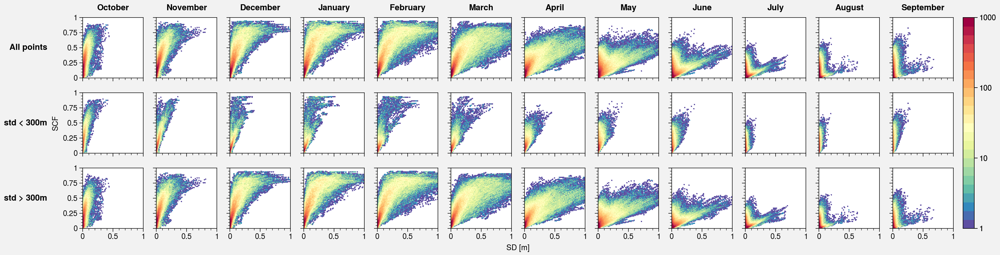

In [103]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9]
threshold = 300
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months]
)

## Reproduce Swenson and Lawrence figures
http://doi.wiley.com/10.1029/2012JD018178

Figure 6 and 8

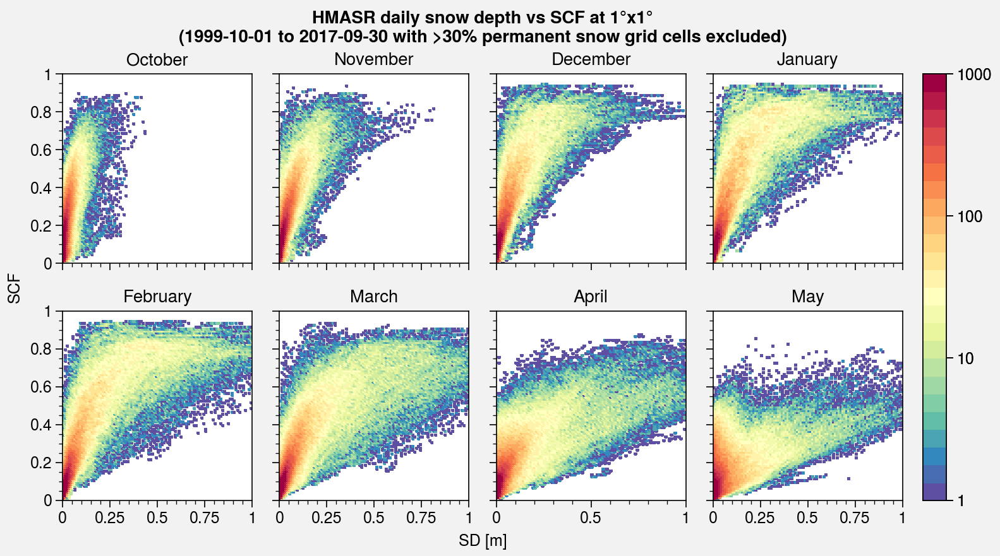

In [176]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5]

fig, axs = plot.subplots(ncols=4, nrows=2, axwidth=1.5)

for ax, month in zip(axs, months):
    m = ax.hist2d(
        sd.where( (sd['time.month'] == month) & (mask < 30)).values.flatten(),
        scf.where( (scf['time.month'] == month) & (mask < 30)).values.flatten(),
        bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
    )
    ax.format(
        title=cld.month_name[month],
        xlabel='SD [m]',
        ylabel='SCF',
    )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    suptitle='HMASR daily snow depth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

In [ ]:
densities_NY07 = [250.957, 265.962, 279.74, 318.128]
x = plot.arange(0, 1, 0.01)
ax.plot(x, np.tanh(x/(2.5*0.01*(rho_NY07/100)**1.6)), color='k')
#     ax.plot(x, NY07(x, 0.01, rho_HMASR, 100, 1.6), color='k')
    ax.format(
        title=cld.month_name[month],
        xlabel='SD [m]',
        ylabel='SCF',
    )

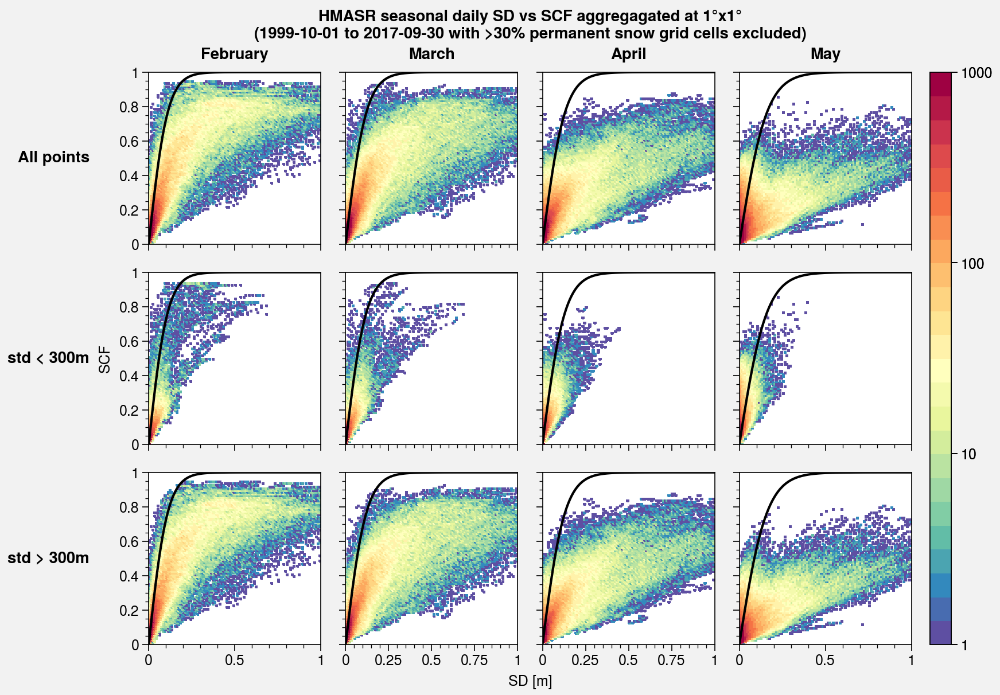

In [107]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [2, 3, 4, 5]
threshold = 300
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

densities_NY07 = [250.957, 265.962, 279.74, 318.128]
x = plot.arange(0, 1, 0.01)

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1.5)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.plot(x, np.tanh(x/(2.5*0.01*(densities_NY07[i]/100)**1.6)), color='k')
        ax.format(
#             title=cld.month_name[month],
            xlabel='SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months],
    suptitle='HMASR seasonal daily SD vs SCF aggregagated at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

# fig.save('img/HMASR_SD_SCF_100km_1999-2017_30_STD_300.jpg')

In [108]:
# Compute relative depth

max_year = sd.where( (sd['time.month'] >= 2) & (sd['time.month'] <= 5) ).groupby('time.year').max()
sd_depl = sd.where( (sd['time.month'] >= 2) & (sd['time.month'] <= 5) )
scf_depl = scf.where( (scf['time.month'] >= 2) & (scf['time.month'] <= 5) )

sd_depl_norm = sd_depl.copy()
for year in max_year.year.values:
    sd_depl_norm.loc[dict(time=str(year))] = sd_depl.sel(time=str(year))/max_year.sel(year=year)

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: All-NaN slice encountered
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


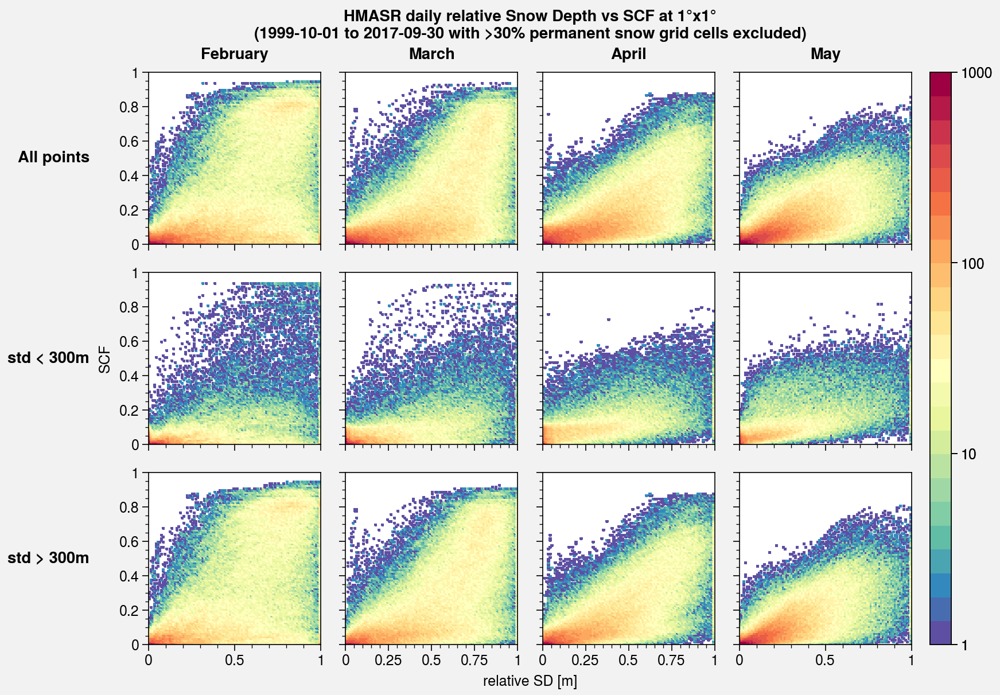

In [110]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [2, 3, 4, 5]
threshold = 300
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1.5)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd_depl_norm.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='relative SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months],
    suptitle='HMASR daily relative Snow Depth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

# fig.save('img/HMASR_rel_SD_SCF_100km_1999-2017_30_STD_300.jpg')

We don't obtain similar plot than SL12 for this last plot with relative depth. It might be because there are not much flat areas over HMA, and in addition flat areas are quite dry over the TP.

In [111]:
# Compute relative depth

max_year = sd.where( (swe['time.month'] >= 2) & (swe['time.month'] <= 5) ).groupby('time.year').max()
swe_depl = sd.where( (swe['time.month'] >= 2) & (swe['time.month'] <= 5) )
scf_depl = scf.where( (scf['time.month'] >= 2) & (scf['time.month'] <= 5) )

swe_depl_norm = swe_depl.copy()
for year in max_year.year.values:
    swe_depl_norm.loc[dict(time=str(year))] = swe_depl.sel(time=str(year))/max_year.sel(year=year)

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: All-NaN slice encountered
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


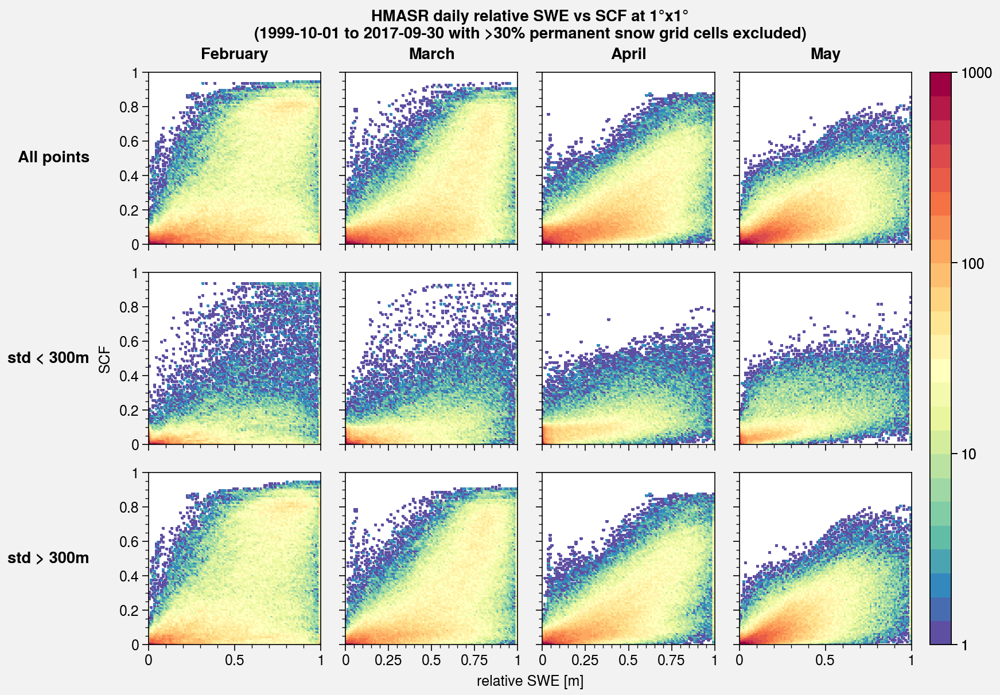

In [112]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [2, 3, 4, 5]
threshold = 300
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1.5)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            swe_depl_norm.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='relative SWE [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months],
    suptitle='HMASR daily relative SWE vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

### Check density

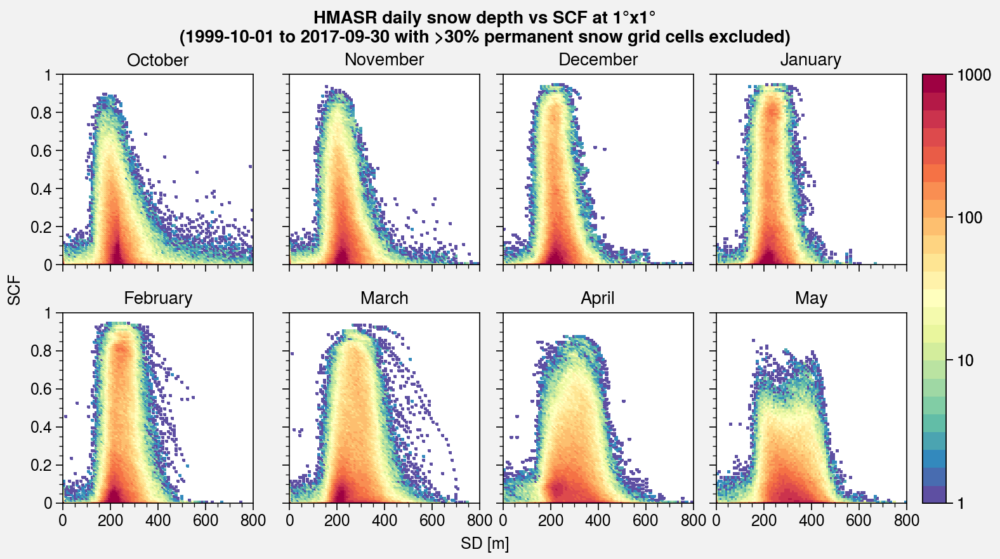

In [4]:
xylim = [[0, 800], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5]

fig, axs = plot.subplots(ncols=4, nrows=2, axwidth=1.5)

for ax, month in zip(axs, months):
    m = ax.hist2d(
        (swe/sd*1000).where( (sd['time.month'] == month) & (mask < 30)).values.flatten(),
        scf.where( (scf['time.month'] == month) & (mask < 30)).values.flatten(),
        bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
    )
    ax.format(
        title=cld.month_name[month],
        xlabel='SD [m]',
        ylabel='SCF',
    )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    suptitle='HMASR daily snow depth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

In [185]:
(swe/sd.where( (sd>swe) )*1000).where(mask < 30).groupby('time.month').mean('time').mean(('lat', 'lon'))

<xarray.DataArray (month: 12)>
array([228.31798, 237.87929, 264.8633 , 290.05188, 299.25375, 297.8882 ,
       289.63568, 273.43994, 256.29376, 230.40762, 224.48651, 227.44112],
      dtype=float32)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

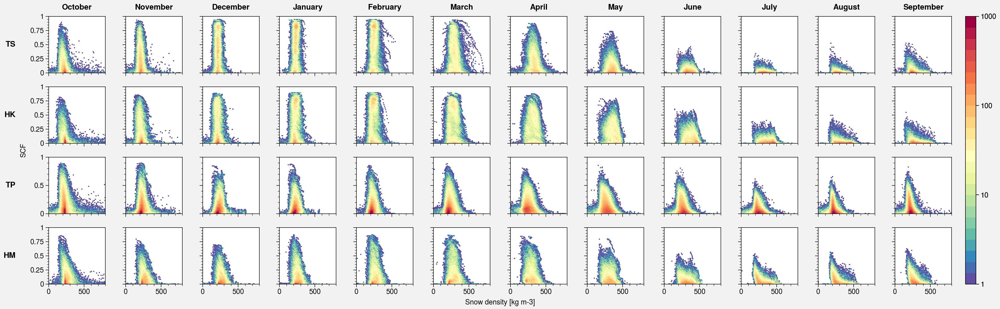

In [548]:
xylim = [[0, 800], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9]
zones = ['TS', 'HK', 'TP', 'HM']

fig, axs = plot.subplots(ncols=len(months), nrows=4, axwidth=1)

for j, zone in enumerate(zones):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            (swe/sd*1000).sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( (sd['time.month'] == month) & (mask < 30) ).values.flatten(),
            scf.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( (scf['time.month'] == month) & (mask < 30) ).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='Snow density [kg m-3]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=zones,
    collabels=[cld.month_name[month] for month in months]
)

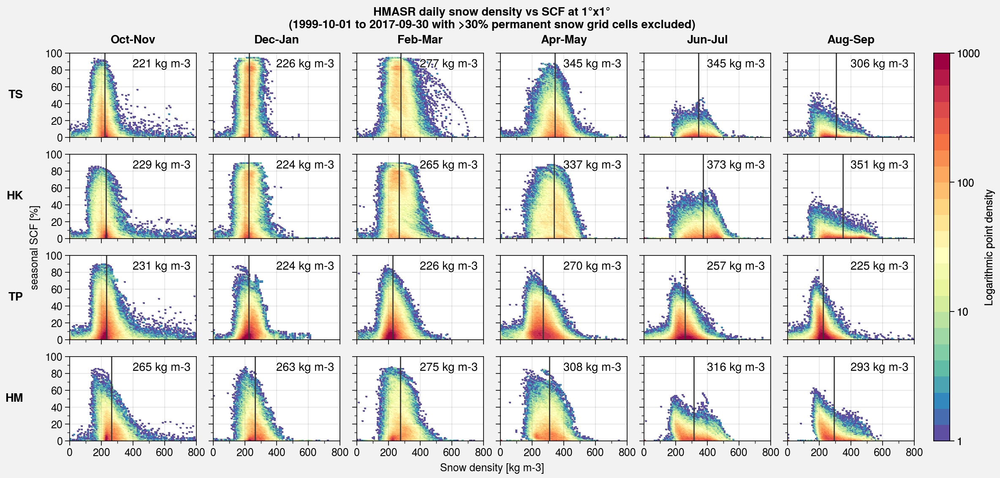

In [585]:
xylim = [[0, 800], [0, 100]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [[10, 11], [12, 1], [2, 3], [4, 5], [6, 7], [8, 9]]
zones = ['TS', 'HK', 'TP', 'HM']

fig, axs = plot.subplots(ncols=len(months), nrows=4, axwidth=1.5, aspect=1.5, space=0.2)

for j, zone in enumerate(zones):
    for i, month in enumerate(months):
        ax = axs[j, i]
        density = (swe/sd*1000).sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( 
                ( (sd['time.month'] == month[0]) | (sd['time.month'] == month[1]) )  & (mask < 30) )
        m = ax.hist2d(density.values.flatten(),
            scf.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( 
                ( (scf['time.month'] == month[0]) | (sd['time.month'] == month[1]) )  & (mask < 30) ).values.flatten()*100,
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        
        mean = density.where(density < 1000).mean()
        
        ax.format(
            xlabel='Snow density [kg m-3]',
            ylabel='seasonal SCF [%]',
            urtitle='{:.0f} kg m-3'.format(mean.values)
        )
        
        ax.axvline(mean, lw=1, ls='-', color='dark gray')


fig.colorbar(m[3], ticks=np.logspace(0, 3, 4), label='Logarithmic point density')

axs.format(
    suptitle='HMASR daily snow density vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)',
    rowlabels=zones,
    collabels=[cld.month_abbr[month[0]]+'-'+cld.month_abbr[month[1]] for month in months], 
    grid=True, 
    xlocator=200, xminorlocator=100,
    ylocator=20, yminorlocator=10,
)

# fig.save('img/snow_density.jpg')

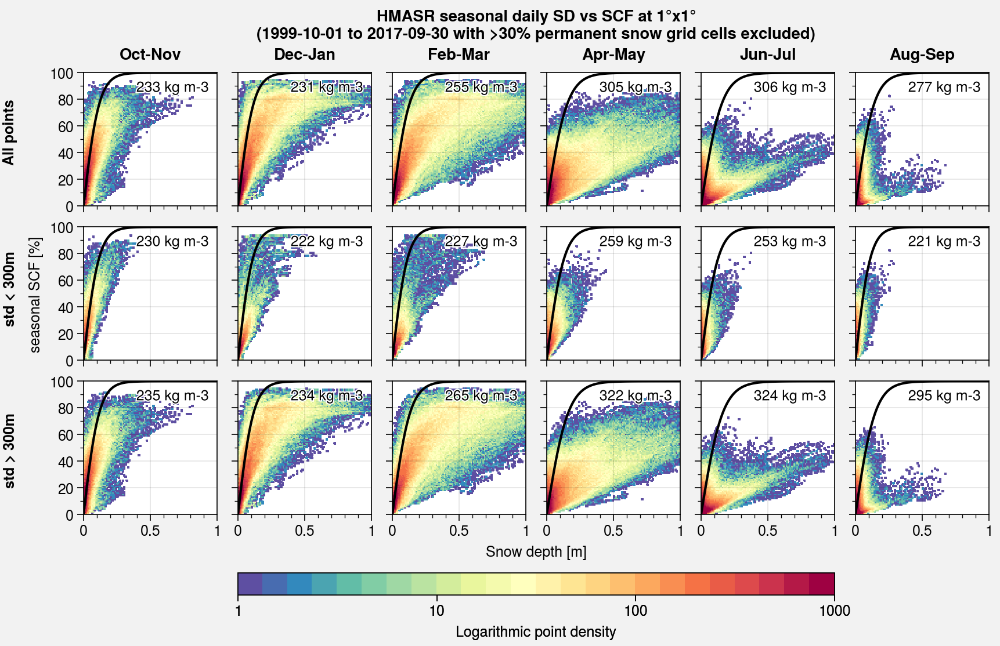

In [652]:
xylim = [[0, 1], [0, 100]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [[10, 11], [12, 1], [2, 3], [4, 5], [6, 7], [8, 9]]
threshold = 300
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=len(stds), axwidth=1.15, aspect=1, space=0.18)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        density = (swe/sd*1000).where( ( (sd['time.month'] == month[0]) | (sd['time.month'] == month[1]) )  & (mask < 30) & std )
        x = sd.where( ( (scf['time.month'] == month[0]) | (scf['time.month'] == month[1]) )  & (mask < 30) & std ).values.flatten()
        y = scf.where( ( (scf['time.month'] == month[0]) | (scf['time.month'] == month[1]) )  & (mask < 30) & std ).values.flatten()*100
        
        m = ax.hist2d(x, y,bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels)
        
        mean = density.where(density < 917).mean()
        
        ax.format(
            xlabel='Snow depth [m]',
            ylabel='seasonal SCF [%]',
            urtitle='{:.0f} kg m-3'.format(mean.values),
            rc_kw={'title.size': 9}
        )
        
        x = plot.arange(0, 1, 0.01)
        y = np.tanh(x/(2.5*0.01*(mean.values.item(0)/50)**1))*100
        ax.plot(x, y, color='k')

for pos, label in zip(np.linspace(0.25, 0.75, 3), ['All points', 'STD < '+str(threshold)+' m', 'STD > '+str(threshold)+' m'][::-1]):
    fig.text(0.003, pos, label, fontweight='bold', rotation='vertical')
        

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4), label='Logarithmic point density', loc='b', span=(2,5))

axs.format(
    suptitle='HMASR seasonal daily SD vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)',
#     rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_abbr[month[0]]+'-'+cld.month_abbr[month[1]] for month in months], 
    grid=True, 
    xlocator=0.5, xminorlocator=0.1,
    ylocator=20, yminorlocator=10,
)

# fig.save('img/snow_depth_vs_SCF.jpg')

## Make plot functions

### Compute weights
Taking into account:
- cos(lat)
- fraction of seasonal snow in a grid cell
- exclude cells with >30% of permanent snow

Weigths used to compute metrics (but not for optimization? -> maybe)

In [5]:
lat_weights = np.cos(np.deg2rad(scf.lat))
frac_seasonal_snow = (1-mask/100).where(scf[0]*0+1 == 1)
temp = (frac_seasonal_snow*lat_weights).where(mask<30)
weights = (temp / temp.sum()).fillna(0)
np.testing.assert_equal(weights.sum().values.item(0), 1)

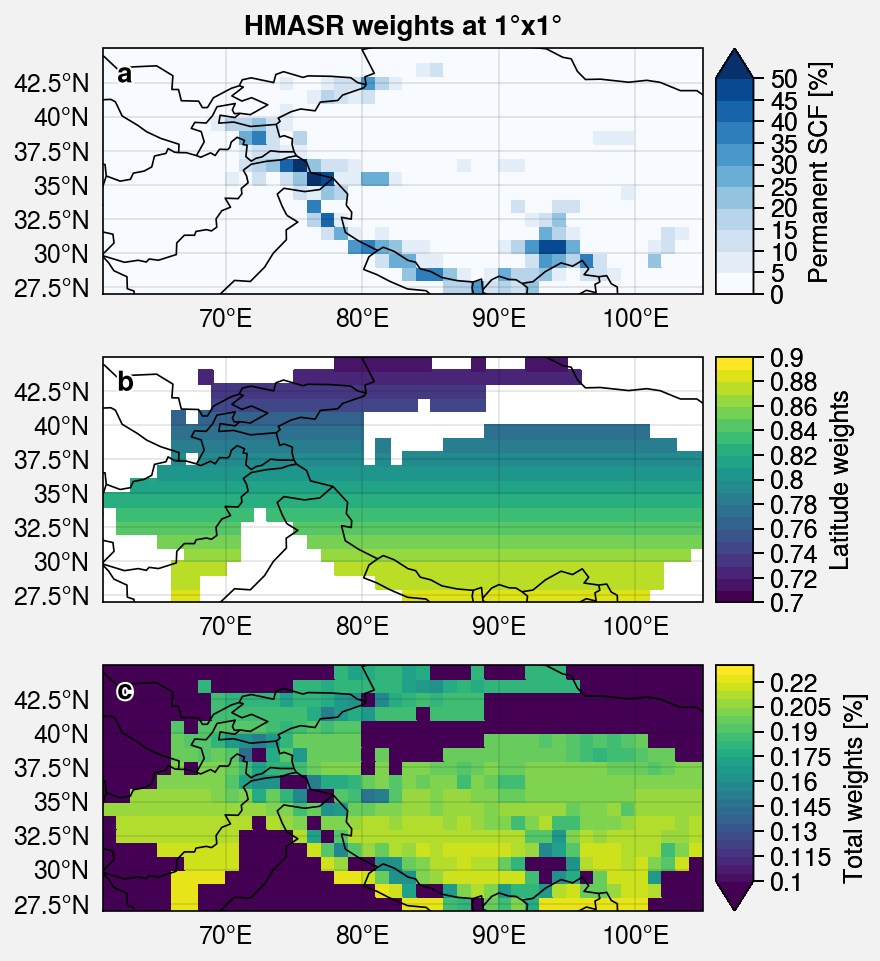

In [6]:
fig, axs = plot.subplots(proj='cyl', ncols=1, nrows=3, axwidth=3)

threshold = 30 # percentage of permanent snow in a cell

axs[0].pcolormesh(mask, levels=plot.arange(0, 50, 5), extend='max', cmap='Blues',
                 colorbar='r', colorbar_kw={'label': 'Permanent SCF [%]'})

axs[1].pcolormesh((scf[0]*0+1)*lat_weights, levels=plot.arange(0.7, 0.9, 0.01), cmap='viridis',
                 colorbar='r', colorbar_kw={'label': 'Latitude weights'})

axs[2].pcolormesh(weights*100, levels=plot.arange(0.0010, 0.0023, 0.00005)*100, cmap='viridis', extend='min',
                 colorbar='r', colorbar_kw={'label': 'Total weights [%]'})
# axs[2].format(title='Total weights (latitude + non-seasonal SCF\nwith >30% permanent snow grid cells excluded)')


# Format
axs.format(
    borders=True, labels=True, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    suptitle='HMASR weights at 1°x1°',
    abc=True, abcloc='ul'
)

# fig.save('img/weights.jpg')

### Check zones

In [7]:
# Get zone limits for annual cycle
lonlim_TS, latlim_TS, lonlim_HK, latlim_HK, lonlim_TP, latlim_TP, lonlim_HM, latlim_HM = u.get_zones()

# HMA for full domain and the following for the above zones
zones = ['HMA', 'TS', 'HK', 'TP', 'HM']
zones_df = pd.DataFrame(
    [[lonlim, latlim], [lonlim_TS, latlim_TS], [lonlim_HK, latlim_HK], [lonlim_TP, latlim_TP], [lonlim_HM, latlim_HM]], 
    columns=pd.Index(['lonlim', 'latlim'], name='Limits'),
    index=pd.Index(zones, name='Zones')
)

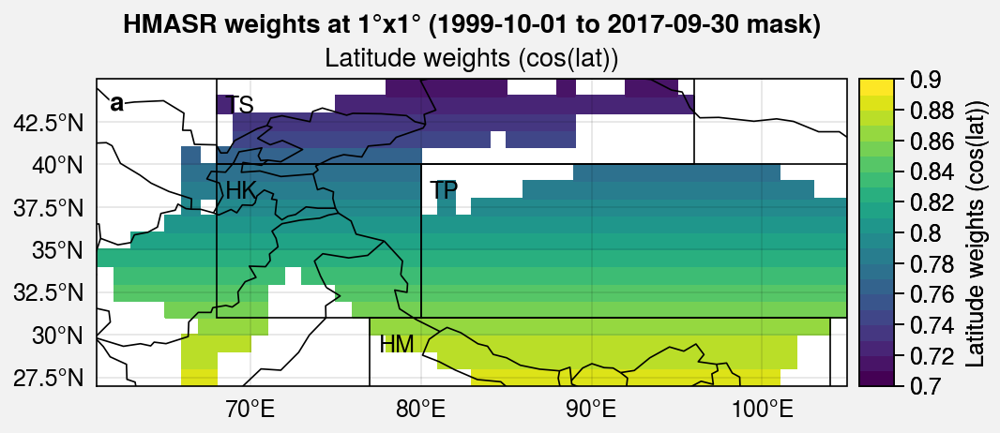

In [8]:
fig, axs = plot.subplots(proj='cyl', ncols=1, nrows=1, axwidth=4)

threshold = 30 # percentage of permanent snow in a cell

axs[0].pcolormesh(((scf[0]*0+1)*lat_weights), 
                  levels=plot.arange(0.7, 0.9, 0.01), cmap='viridis',
                 colorbar='r', colorbar_kw={'label': 'Latitude weights (cos(lat))'})
axs[0].format(title='Latitude weights (cos(lat))')

u.plot_zones(axs[0])

# Format
axs.format(
    borders=True, labels=True, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    suptitle='HMASR weights at 1°x1° (1999-10-01 to 2017-09-30 mask)',
    abc=True, abcloc='ul'
)

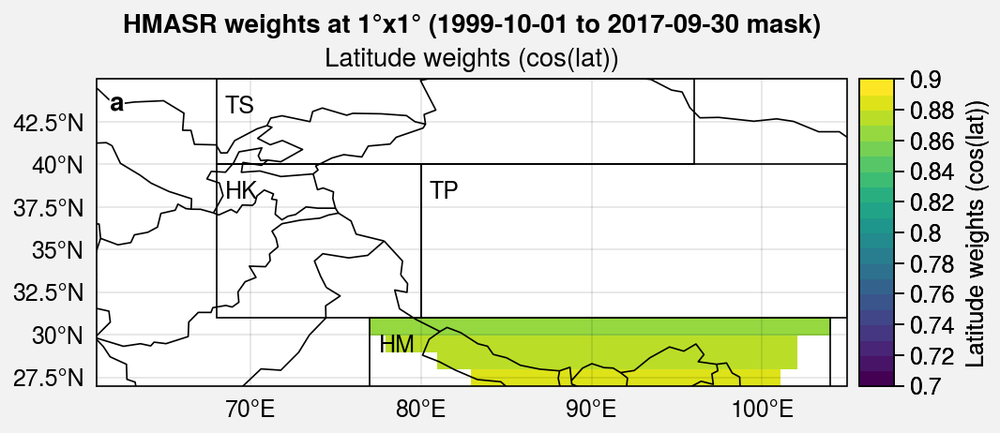

In [9]:
fig, axs = plot.subplots(proj='cyl', ncols=1, nrows=1, axwidth=4)

threshold = 30 # percentage of permanent snow in a cell

axs[0].pcolormesh(((scf[0]*0+1)*lat_weights).sel(lat=latlim_HM, lon=lonlim_HM), 
                  levels=plot.arange(0.7, 0.9, 0.01), cmap='viridis',
                 colorbar='r', colorbar_kw={'label': 'Latitude weights (cos(lat))'})
axs[0].format(title='Latitude weights (cos(lat))')

u.plot_zones(axs[0])

# Format
axs.format(
    borders=True, labels=True, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    suptitle='HMASR weights at 1°x1° (1999-10-01 to 2017-09-30 mask)',
    abc=True, abcloc='ul'
)

## SCF params

In [10]:
# R01
def R01(swe, zstd):
    return 0.95 * np.tanh(100*swe) * np.sqrt( 1000*swe / ( 1000*swe + 0.15*zstd + 1e-6) )

scf_R01 = R01(swe, topo_std)

def R01_opti(swe, zstd, alpha, beta):
    return 0.95 * np.tanh(100*swe) * ( 1000*swe / ( 1000*swe + alpha*zstd + 1e-6) )**beta

scf_R01_opti = R01_opti(swe, topo_std, 1.15, 0.32)


# NY07
def NY07(sd, z0, rho_snow, rho_new, m):
    scf = np.tanh(sd/(2.5*z0*(rho_snow/rho_new)**m))
    return scf.where((sd>1e-7) & (swe>1e-7) & (rho_snow<917), other=0).where( (sd*0+1) == 1).where(mask < 30)

scf_NY07_orig = NY07(sd, 0.01, swe/sd*1000, 100, 1.6)
scf_NY07_orch = NY07(sd, 0.01, swe/sd*1000, 50, 1)


# SL12
def SL12(swe, topo_std):
    
    # Initialize with first SCF
    temp = scf.copy()
    temp[1:] = np.nan 
    
    N_melt = 200 / topo_std.where(topo_std > 10, other=10) # eq. (5) in SL12 (modified)
    swe_max = ( 2. * swe[0] ) / ( 1 + np.cos( np.pi * (1 - temp[0])**(1/N_melt) ) )

    for i_time in range(swe.time.size-1):
#         print(i_time)

        delta_swe = swe[i_time+1]-swe[i_time]
                
        melt = (1 - ( 1 / np.pi * np.arccos( 2 * (swe[i_time+1] / swe_max).where(swe[i_time+1] / swe_max < 1) - 1 ) )**N_melt)

        k = 0.1 # 0.1 in SL12
        accu = (1 - ( 1 - (k*delta_swe*1e3).where(k*delta_swe*1e3 < 1, 1).where(delta_swe*0+1 == 1) ) * ( 1. - temp[i_time] ))
        total = accu.where( (delta_swe > 1e-6), melt)
        temp[i_time+1] = total.where(total > 0, 0).where(scf[0]*0+1 == 1) 
        
        swe_max = ( ( 2. * swe[i_time+1] ) / ( 1 + np.cos( np.pi * (1 - temp[i_time+1])**(1/N_melt) ) ) ).where(delta_swe > 1e-6, swe_max)
    
    return temp

scf_SL12 = SL12(swe, topo_std)

def SL12_opti(swe, topo_std, k, alpha):
    
    # Initialize with first SCF
    temp = scf.copy()
    temp[1:] = np.nan
    
    N_melt = alpha / topo_std.where(topo_std > 10, other=10) # eq. (5) in SL12 (modified)
    swe_max = ( 2. * swe[0] ) / ( 1 + np.cos( np.pi * (1 - temp[0])**(1/N_melt) ) )

#     for i_time in range(swe.time.size-1):
    for i_time in range(swe.time.size-1):

        delta_swe = swe[i_time+1]-swe[i_time]
                
        melt = (1 - ( 1 / np.pi * np.arccos( 2 * (swe[i_time+1] / swe_max).where(swe[i_time+1] / swe_max < 1) - 1 ) )**N_melt)

        accu = (1 - ( 1 - (k*delta_swe*1e3).where(k*delta_swe*1e3 < 1, 1).where(delta_swe*0+1 == 1) ) * ( 1. - temp[i_time] ))
        total = accu.where( (delta_swe > 1e-6), melt)
        temp[i_time+1] = total.where(total > 0, 0).where(scf[0]*0+1 == 1) 
        
        swe_max = ( ( 2. * swe[i_time+1] ) / ( 1 + np.cos( np.pi * (1 - temp[i_time+1])**(1/N_melt) ) ) ).where(delta_swe > 1e-6, swe_max)
    
    return temp

scf_SL12_opti = SL12_opti(swe, topo_std, 0.022, 200)


# LA22
def LA22(sd, z0, rho_snow, rho_new, m, zstd, zstd_0, m2):
    scf = np.tanh(sd/(2.5*z0*(rho_snow/rho_new)**m + zstd_0*zstd*(rho_snow/rho_new)**m2 ))
    return scf.where((sd>1e-7) & (swe>1e-7) & (rho_snow<917), other=0).where( (sd*0+1) == 1).where(mask < 30)

scf_LA22 = LA22(sd, 0.01, swe/sd*1000, 50, 1, topo_std, 3e-6, 3)

# DNN
scf_DNN = xr.open_dataarray('results/scf_100km_ML3.nc')


## Spatial bias

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of emp

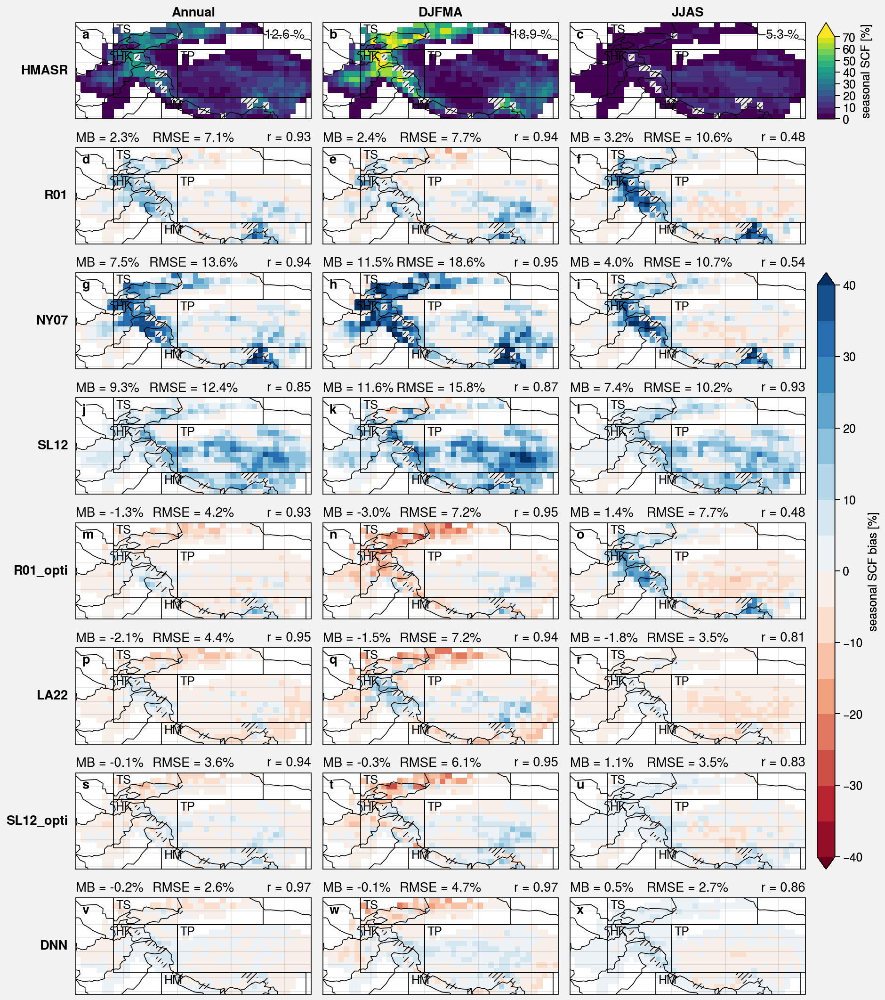

In [13]:
seasons=['Annual', 'DJFMA', 'JJAS']; freq='D'
levels=plot.arange(0, 70, 5); extend='max'; cmap='viridis'
levels_bias=plot.arange(-40, 40, 5); extend_bias='both'; cmap_bias='RdBu'
threshold=30 # percentage of permanent snow in a cell
params = ['R01', 'NY07', 'SL12', 'R01_opti', 'LA22', 'SL12_opti', 'DNN']
scf_params = [scf_R01, scf_NY07_orch, scf_SL12, scf_R01_opti, scf_LA22, scf_SL12_opti, scf_DNN]

fig, axs = plot.subplots(proj='cyl', ncols=len(seasons), nrows=len(params)+1, axwidth=2.5)

# HMASR
scf_ref_seasons = []
for i, season in enumerate(seasons):
    data = u.clim(scf.sel(time=val_period), freq=freq, season=season, skipna=True)*100
    scf_ref_seasons.append(data)
    m = axs[0, i].pcolormesh(data, levels=levels, extend=extend, cmap=cmap)
    axs[0, i].format(urtitle='{:.1f} %'.format(data.weighted(weights).sum().values.item(0)))

# bias
for j, param in enumerate(params):
    for i, season in enumerate(seasons):
        scf_param_clim = u.clim(scf_params[j].sel(time=val_period), freq=freq, season=season, skipna=True)*100

        m_bias = axs[j+1, i].pcolormesh(scf_param_clim-scf_ref_seasons[i], levels=levels_bias, extend=extend_bias, cmap=cmap_bias)

        mb = u.weighted_mean(scf_param_clim-scf_ref_seasons[i], weights).values.item(0)
        rmse = u.weighted_rmse(scf_param_clim, scf_ref_seasons[i], weights).values.item(0)
        r = u.weighted_corr(scf_param_clim, scf_ref_seasons[i], weights).values.item(0)
        axs[j+1, i].format(ltitle='MB = {:.1f}%'.format(mb), ctitle='RMSE = {:.1f}%'.format(rmse), rtitle='r = {:.2}'.format(r))

# mask
for ax in axs:
    ax.pcolormesh(mask.where(mask>threshold)*0+1, cmap='lightgray', levels=[0, 1, 2, 3])
    plot_hatches_mask(ax)
    u.plot_zones(ax=ax)
#     ax.format(utitle='aze')

# Colorbars
fig.colorbar(m, label='seasonal SCF [%]', row=1, ticks=10)
fig.colorbar(m_bias, label='seasonal SCF bias [%]', rows=(3, 7), ticks=10)

# Format
axs.format(
    borders=True, labels=False, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
#     suptitle=param+' daily non-permanent SCF at 1°x1° predicted from HMASR inputs\n(1999-10-01 to 2017-09-30; grid cells with >30% permanent snow are excluded)',
    abc=True, abcloc='ul',
    collabels=seasons,
    rowlabels=list(np.insert(params, 0, 'HMASR'))
)


# fig.save('img/spatial_bias_validation_1deg.jpg')

## Rajout de la corrélation spatiale avec la STD

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of emp

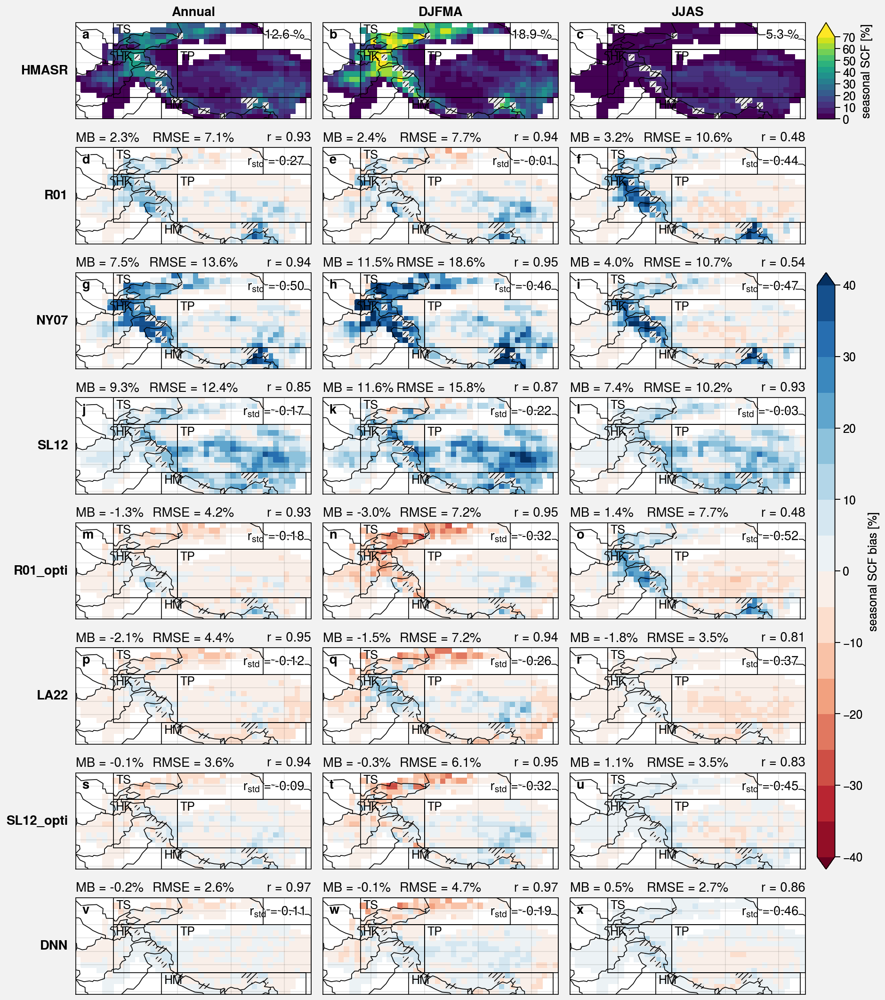

In [14]:
seasons=['Annual', 'DJFMA', 'JJAS']; freq='D'
levels=plot.arange(0, 70, 5); extend='max'; cmap='viridis'
levels_bias=plot.arange(-40, 40, 5); extend_bias='both'; cmap_bias='RdBu'
threshold=30 # percentage of permanent snow in a cell
params = ['R01', 'NY07', 'SL12', 'R01_opti', 'LA22', 'SL12_opti', 'DNN']
scf_params = [scf_R01, scf_NY07_orch, scf_SL12, scf_R01_opti, scf_LA22, scf_SL12_opti, scf_DNN]

fig, axs = plot.subplots(proj='cyl', ncols=len(seasons), nrows=len(params)+1, axwidth=2.5)

# HMASR
scf_ref_seasons = []
for i, season in enumerate(seasons):
    data = u.clim(scf.sel(time=val_period), freq=freq, season=season, skipna=True)*100
    scf_ref_seasons.append(data)
    m = axs[0, i].pcolormesh(data, levels=levels, extend=extend, cmap=cmap)
    axs[0, i].format(urtitle='{:.1f} %'.format(data.weighted(weights).sum().values.item(0)))

# bias
for j, param in enumerate(params):
    for i, season in enumerate(seasons):
        scf_param_clim = u.clim(scf_params[j].sel(time=val_period), freq=freq, season=season, skipna=True)*100
        
        bias = scf_param_clim-scf_ref_seasons[i]
        m_bias = axs[j+1, i].pcolormesh(bias, levels=levels_bias, extend=extend_bias, cmap=cmap_bias)

        mb = u.weighted_mean(bias, weights).values.item(0)
        rmse = u.weighted_rmse(scf_param_clim, scf_ref_seasons[i], weights).values.item(0)
        r = u.weighted_corr(scf_param_clim, scf_ref_seasons[i], weights).values.item(0)
        r_std = u.weighted_corr(bias, topo_std, weights).values.item(0)
        r_topo = u.weighted_corr(bias, topo, weights).values.item(0)
        axs[j+1, i].format(
            ltitle='MB = {:.1f}%'.format(mb), ctitle='RMSE = {:.1f}%'.format(rmse), rtitle='r = {:.2}'.format(r),
            urtitle='$r_{std}$'+' = {:.2f}'.format(r_std)
        )

# mask
for ax in axs:
    ax.pcolormesh(mask.where(mask>threshold)*0+1, cmap='lightgray', levels=[0, 1, 2, 3])
    plot_hatches_mask(ax)
    u.plot_zones(ax=ax)
#     ax.format(utitle='aze')

# Colorbars
fig.colorbar(m, label='seasonal SCF [%]', row=1, ticks=10)
fig.colorbar(m_bias, label='seasonal SCF bias [%]', rows=(3, 7), ticks=10)

# Format
axs.format(
    borders=True, labels=False, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
#     suptitle=param+' daily non-permanent SCF at 1°x1° predicted from HMASR inputs\n(1999-10-01 to 2017-09-30; grid cells with >30% permanent snow are excluded)',
    abc=True, abcloc='ul',
    collabels=seasons,
    rowlabels=list(np.insert(params, 0, 'HMASR'))
)


fig.save('img/spatial_bias_validation_100km.jpg')

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of emp

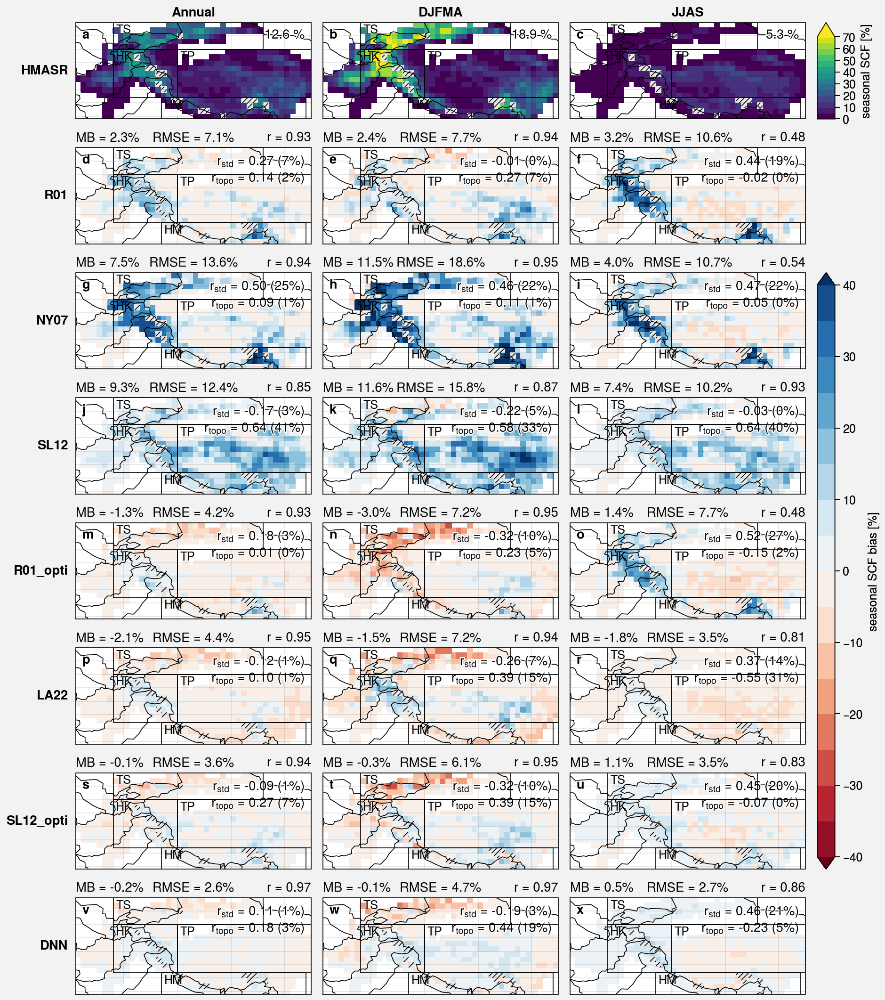

In [36]:
seasons=['Annual', 'DJFMA', 'JJAS']; freq='D'
levels=plot.arange(0, 70, 5); extend='max'; cmap='viridis'
levels_bias=plot.arange(-40, 40, 5); extend_bias='both'; cmap_bias='RdBu'
threshold=30 # percentage of permanent snow in a cell
params = ['R01', 'NY07', 'SL12', 'R01_opti', 'LA22', 'SL12_opti', 'DNN']
scf_params = [scf_R01, scf_NY07_orch, scf_SL12, scf_R01_opti, scf_LA22, scf_SL12_opti, scf_DNN]

fig, axs = plot.subplots(proj='cyl', ncols=len(seasons), nrows=len(params)+1, axwidth=2.5)

# HMASR
scf_ref_seasons = []
for i, season in enumerate(seasons):
    data = u.clim(scf.sel(time=val_period), freq=freq, season=season, skipna=True)*100
    scf_ref_seasons.append(data)
    m = axs[0, i].pcolormesh(data, levels=levels, extend=extend, cmap=cmap)
    axs[0, i].format(urtitle='{:.1f} %'.format(data.weighted(weights).sum().values.item(0)))

# bias
for j, param in enumerate(params):
    for i, season in enumerate(seasons):
        scf_param_clim = u.clim(scf_params[j].sel(time=val_period), freq=freq, season=season, skipna=True)*100
        
        bias = scf_param_clim-scf_ref_seasons[i]
        m_bias = axs[j+1, i].pcolormesh(bias, levels=levels_bias, extend=extend_bias, cmap=cmap_bias)

        mb = u.weighted_mean(bias, weights).values.item(0)
        rmse = u.weighted_rmse(scf_param_clim, scf_ref_seasons[i], weights).values.item(0)
        r = u.weighted_corr(scf_param_clim, scf_ref_seasons[i], weights).values.item(0)
        r_std = u.weighted_corr(bias, topo_std, weights).values.item(0)
        r_topo = u.weighted_corr(bias, topo, weights).values.item(0)
        axs[j+1, i].format(
            ltitle='MB = {:.1f}%'.format(mb), ctitle='RMSE = {:.1f}%'.format(rmse), rtitle='r = {:.2}'.format(r),
            urtitle='$r_{std}$'+' = {:.2f}'.format(r_std) + ' ({:.0f}%)'.format(r_std**2*100) +'\n$r_{topo}$'+' = {:.2f}'.format(r_topo)  + ' ({:.0f}%)'.format(r_topo**2*100)
        )

# mask
for ax in axs:
    ax.pcolormesh(mask.where(mask>threshold)*0+1, cmap='lightgray', levels=[0, 1, 2, 3])
    plot_hatches_mask(ax)
    u.plot_zones(ax=ax)
#     ax.format(utitle='aze')

# Colorbars
fig.colorbar(m, label='seasonal SCF [%]', row=1, ticks=10)
fig.colorbar(m_bias, label='seasonal SCF bias [%]', rows=(3, 7), ticks=10)

# Format
axs.format(
    borders=True, labels=False, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
#     suptitle=param+' daily non-permanent SCF at 1°x1° predicted from HMASR inputs\n(1999-10-01 to 2017-09-30; grid cells with >30% permanent snow are excluded)',
    abc=True, abcloc='ul',
    collabels=seasons,
    rowlabels=list(np.insert(params, 0, 'HMASR'))
)


# fig.save('img/spatial_bias_validation_1deg.jpg')

## Time series

In [151]:
column_indexes = [['train', 'val'], ['HMASR', 'R01', 'NY07', 'SL12', 'R01_opti', 'LA22', 'SL12_opti', 'DNN']]
columns = pd.MultiIndex.from_product(column_indexes)

row_indexes = [zones, ['mb', 'rmse', 'r', 'std']]
rows = pd.MultiIndex.from_product(row_indexes)

df_metrics = pd.DataFrame(index=rows, columns=columns)
df_metrics

train                                               val            \
         HMASR  R01 NY07 SL12 R01_opti LA22 SL12_opti  DNN HMASR  R01 NY07   
HMA mb     NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    rmse   NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    r      NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    std    NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
TS  mb     NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    rmse   NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    r      NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    std    NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
HK  mb     NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    rmse   NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    r      NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    std    NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
TP  mb     NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    rmse   NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    r      NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    std    NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
HM  mb     NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    rmse   NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    r      NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   
    std    NaN  NaN  NaN  NaN      NaN  NaN       NaN  NaN   NaN  NaN  NaN   

                                            
         SL12 R01_opti LA22 SL12_opti  DNN  
HMA mb    NaN      NaN  NaN       NaN  NaN  
    rmse  NaN      NaN  NaN       NaN  NaN  
    r     NaN      NaN  NaN       NaN  NaN  
    std   NaN      NaN  NaN       NaN  NaN  
TS  mb    NaN      NaN  NaN       NaN  NaN  
    rmse  NaN      NaN  NaN       NaN  NaN  
    r     NaN      NaN  NaN       NaN  NaN  
    std   NaN      NaN  NaN       NaN  NaN  
HK  mb    NaN      NaN  NaN       NaN  NaN  
    rmse  NaN      NaN  NaN       NaN  NaN  
    r     NaN      NaN  NaN       NaN  NaN  
    std   NaN      NaN  NaN       NaN  NaN  
TP  mb    NaN      NaN  NaN       NaN  NaN  
    rmse  NaN      NaN  NaN       NaN  NaN  
    r     NaN      NaN  NaN       NaN  NaN  
    std   NaN      NaN  NaN       NaN  NaN  
HM  mb    NaN      NaN  NaN       NaN  NaN  
    rmse  NaN      NaN  NaN       NaN  NaN  
    r     NaN      NaN  NaN       NaN  NaN  
    std   NaN      NaN  NaN       NaN  NaN

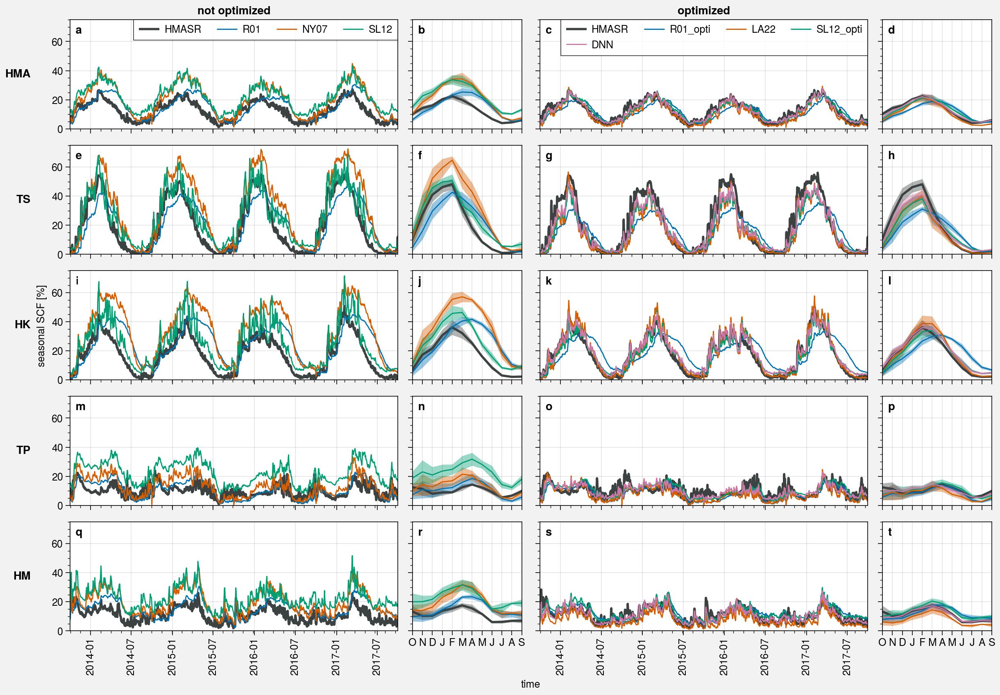

In [153]:
train_period = slice('1999-10-01', '2013-09-30') # ~80%
val_period = slice('2013-10-01', '2017-09-30') # ~20%

import warnings
warnings.filterwarnings("ignore")
zones = ['HMA', 'TS', 'HK', 'TP', 'HM']

fig, axs = plot.subplots(nrows=len(zones), ncols=4, axwidth=4, ref=1, wratios=(3, 1, 3, 1), aspect=3)

list_scf = [scf, scf_R01, scf_NY07_orch, scf_SL12]
labels = ['HMASR', 'R01', 'NY07', 'SL12']
colors = ['charcoal gray', 'C0', 'C1', 'C2', 'C3']
linewidths = [2, 1, 1, 1]
plot.rc.cycle = 'colorblind'

###################
### Time series ###
###################
for i, zone in enumerate(zones):
    ax = axs[i, 0]
    ts_ref = scf.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).weighted(weights).mean(('lat', 'lon'))*100

    for j, da in enumerate(list_scf):
        ts = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=val_period).weighted(weights).mean(('lat', 'lon'))*100
        ax.plot(ts, label=labels[j], color=colors[j], linewidth=linewidths[j])

        # Compute metrics
        for period, period_label in zip([train_period, val_period], ['train', 'val']):
            ts = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=period).weighted(weights).mean(('lat', 'lon'))*100
            
            mb = ( ts - ts_ref.sel(time=period) ).mean().item(0)
            rmse = np.sqrt( ( ( ts - ts_ref.sel(time=period) )**2 ).mean().item(0) )
            r = stats.pearsonr(ts, ts_ref.sel(time=period))[0]
            std = ts.std().item(0)
            
            df_metrics.loc[(zone), (period_label, labels[j])]  = [mb, rmse, r, std]
            

axs[0].legend(ncol=5)

####################
### Annual cycle ###
####################
for i, zone in enumerate(zones):
        ax = axs[i, 1]

        ac_list = []
        for j, da in enumerate(list_scf):
            ac = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=val_period) \
                        .groupby('time.month').mean() \
                        .weighted(weights).mean(('lat', 'lon'))*100
            std = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=val_period) \
                        .weighted(weights).mean(('lat', 'lon')) \
                        .resample(time='M').mean() \
                        .groupby('time.month').std()*100

            ac_list.append(ac)

            ac_shift = ac.reindex(month=np.roll(ac.month,3))
            std_shift = std.reindex(month=np.roll(std.month,3))
            shadedata = [(ac_shift-std_shift).values, (ac_shift+std_shift).values]

            ax.plot(ac_shift.values, shadedata=shadedata, label='SCF', linewidth=linewidths[j], color=colors[j])

        ax.format(
            xlocator='index', xformatter=[cld.month_abbr[month][0] for month in ac.reindex(month=np.roll(ac.month,3)).month.values],
        )
    

list_scf = [scf, scf_R01_opti, scf_NY07_cust, scf_SL12_opti, scf_DNN]
labels = ['HMASR', 'R01_opti', 'LA22', 'SL12_opti', 'DNN']
colors = ['charcoal gray', 'C0', 'C1', 'C2', 'C3']
linewidths = [2, 1, 1, 1, 1]

###################
### Time series ###
###################
for i, zone in enumerate(zones):
    ax = axs[i, 2]
    ts_ref = scf.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).weighted(weights).mean(('lat', 'lon'))*100

    for j, da in enumerate(list_scf):
        ts = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=val_period).weighted(weights).mean(('lat', 'lon'))*100
        ax.plot(ts, label=labels[j], color=colors[j], linewidth=linewidths[j])

        # Compute metrics
        for period, period_label in zip([train_period, val_period], ['train', 'val']):
            ts = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=period).weighted(weights).mean(('lat', 'lon'))*100
            
            mb = ( ts - ts_ref.sel(time=period) ).mean().item(0)
            rmse = np.sqrt( ( ( ts - ts_ref.sel(time=period) )**2 ).mean().item(0) )
            r = stats.pearsonr(ts, ts_ref.sel(time=period))[0]
            std = ts.std().item(0)
            
            df_metrics.loc[(zone), (period_label, labels[j])]  = [mb, rmse, r, std]

axs[0, 2].legend(ncol=4)

####################
### Annual cycle ###
####################
for i, zone in enumerate(zones):
        ax = axs[i, 3]

        ac_list = []
        for j, da in enumerate(list_scf):
            ac = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=val_period) \
                        .groupby('time.month').mean() \
                        .weighted(weights).mean(('lat', 'lon'))*100
            std = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=val_period) \
                        .weighted(weights).mean(('lat', 'lon')) \
                        .resample(time='M').mean() \
                        .groupby('time.month').std()*100

            ac_list.append(ac)

            ac_shift = ac.reindex(month=np.roll(ac.month,3))
            std_shift = std.reindex(month=np.roll(std.month,3))
            shadedata = [(ac_shift-std_shift).values, (ac_shift+std_shift).values]

            ax.plot(ac_shift.values, shadedata=shadedata, label='SCF', linewidth=linewidths[j], color=colors[j])

        ax.format(
            xlocator='index', xformatter=[cld.month_abbr[month][0] for month in ac.reindex(month=np.roll(ac.month,3)).month.values],
#             urtitle='RMSE = {:.1f} %\nr = {:.2f}'.format(rmse, r),
        )

    
for ax in axs:
    ax.autoscale(tight=True)

axs.format(
    collabels=['not optimized', '', 'optimized', ''],
    rowlabels=zones,
    abc=True, abcloc='ul',
    ylim=(0, 75), ylabel='seasonal SCF [%]',
)


# fig.save('img/timeseries_ac_1deg.jpg')

In [154]:
df_metrics

train                                                     \
            HMASR        R01      NY07      SL12  R01_opti      LA22   
HMA mb          0    1.77438   6.87945   8.44439  -1.66167  -2.24255   
    rmse        0    4.85917   8.65292   8.99545   4.33432   2.90268   
    r           1   0.814032  0.932104  0.967687  0.814843   0.96809   
    std     6.905    7.71338   11.0505   9.24679   5.56682   7.31884   
TS  mb          0   0.850236   10.6021   5.61335  -4.08764  -4.22676   
    rmse        0    9.98621   13.6556   7.31561   11.6037   6.45603   
    r           1   0.834389  0.941948  0.967224  0.834313  0.973414   
    std    18.049    14.8717   23.1123   18.4592   10.7078   14.9762   
HK  mb          0    6.53008   15.3731   7.04895  0.650146  0.773111   
    rmse        0    11.8727   18.3425   8.59874   9.05433   3.94039   
    r           1   0.745195  0.903576  0.966933  0.743451  0.972443   
    std   13.5015    14.2153    20.364   16.5757   10.1885   15.3701   
TP  mb          0  0.0653886   2.81206   11.0049  -2.33932  -2.45099   
    rmse        0     4.2763   5.71866   12.0251   4.17086   4.19857   
    r           1   0.655642  0.707917  0.739383  0.657124  0.721277   
    std   4.27419    5.60714   6.98582   7.06074    4.0511   4.77285   
HM  mb          0    2.48761   6.94255   9.66383 -0.410228  -3.55639   
    rmse        0     4.8622   8.62622   10.2816   3.47257   4.19751   
    r           1   0.728049  0.880314  0.878808  0.729694  0.896445   
    std   4.92476    6.04618   8.89105   6.93538    4.3358     4.871   

                                  val                                          \
         SL12_opti       DNN    HMASR       R01      NY07      SL12  R01_opti   
HMA mb   -0.441564 -0.396348        0   2.34397   7.47849    9.3384  -1.27419   
    rmse   2.37616   1.57187        0   5.46397   9.17444   9.90974   4.40494   
    r     0.941103  0.975437        1  0.768814   0.91929  0.953486   0.76957   
    std    6.51225   6.72219  6.56392     7.643   10.6783    8.9199   5.51131   
TS  mb    -2.91132  -1.91493        0  0.865556   10.8894   5.19973   -4.3169   
    rmse   7.06909   4.84991        0   10.1078   14.0924   6.96517   11.7426   
    r     0.961389  0.983998        1  0.832757  0.935583  0.967174   0.83264   
    std    13.2502    14.676  18.1896   15.2184   23.2438   17.9259   10.9294   
HK  mb   -0.180428   1.04287        0   7.52558   16.9778   7.95244   1.39563   
    rmse   3.93079   2.79651        0   12.5261   19.5356   9.26764   9.09099   
    r     0.958043  0.981505        1  0.696146  0.886729  0.964789  0.695506   
    std    12.2697   13.0235   12.462   13.1731   18.8096   15.4734   9.38878   
TP  mb    -0.12383 -0.383538        0  0.584592   3.06617   12.2891  -1.93593   
    rmse   3.59148   3.09069        0   4.51073   5.75434   13.4014   4.00175   
    r     0.633258  0.717361        1  0.669591  0.735522  0.746207   0.67124   
    std    4.09977   3.79947  4.28437   6.01187   7.06092   7.71804   4.35259   
HM  mb    0.946877 -0.402934        0   3.74366   8.07647   11.3426  0.447978   
    rmse    2.6769   2.03621        0   5.89255   9.46122   11.9243   3.86424   
    r      0.86523  0.915958        1   0.65809  0.856977  0.879391  0.665762   
    std    4.67637   4.79109  5.01499   5.83982   8.49365   7.20919   4.19262   

                                        
              LA22 SL12_opti       DNN  
HMA mb    -2.12449 -0.101009  -0.20919  
    rmse   2.82337   2.48506   1.50833  
    r     0.964147  0.925809  0.973764  
    std    6.97965   6.17389   6.37782  
TS  mb    -4.61975  -3.23369  -2.25687  
    rmse   6.96224   7.32197   5.29833  
    r     0.971903  0.963186  0.983264  
    std    14.7121   13.1333   14.4215  
HK  mb     1.40893  0.402966   1.88668  
    rmse   3.92735    3.8172   2.96725  
    r     0.971598  0.953321   0.98317  
    std    14.2858   11.3819   12.0042  
TP  mb    -2.24963  0.263995 -0.180442  
    rmse   3.97482   3.55707 

## Taylor diagrams

Modification of `/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/matplotlib/axes/_subplots.py

```python
if len(args) == 1 and type(args[0]) is int:
    
elif len(args) == 3 or type(args[0]) is tuple:
    if type(args[0]) is tuple:
         args = args[0]

```

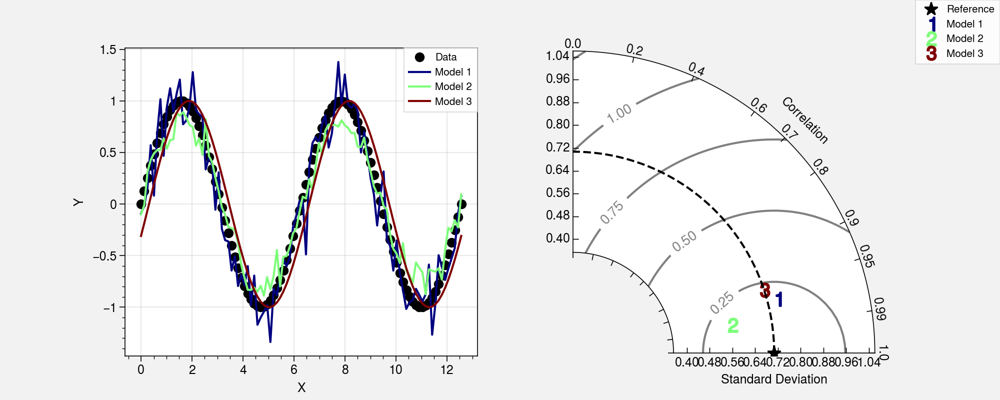

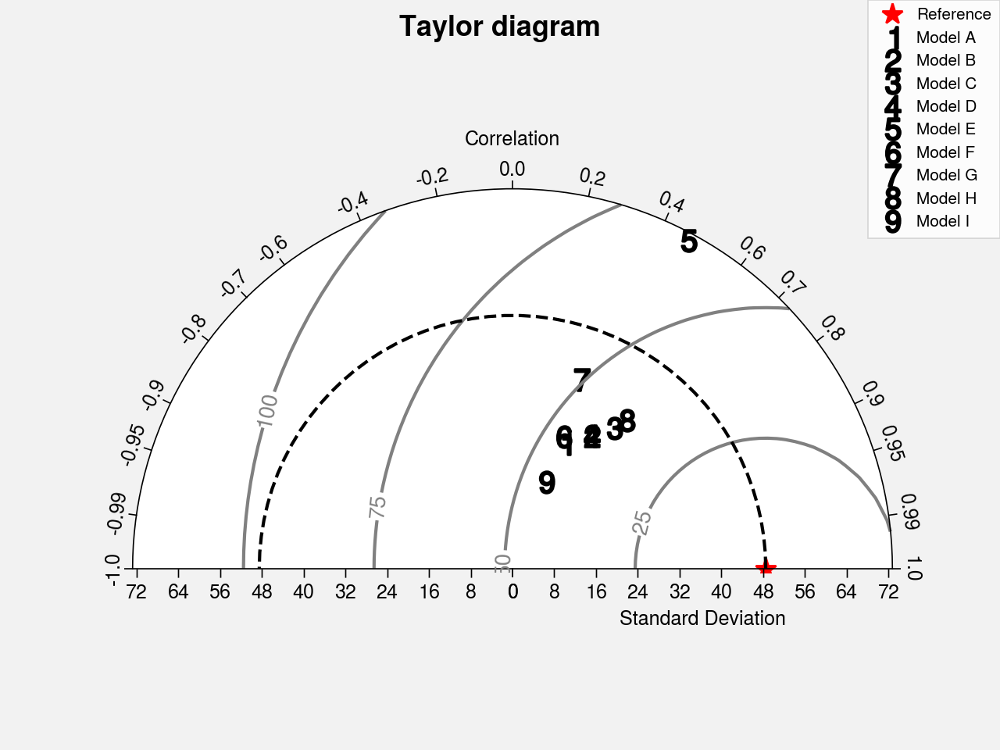

In [341]:
#!/usr/bin/env python
# Copyright: This document has been placed in the public domain.

"""
Taylor diagram (Taylor, 2001) implementation.

Note: If you have found these software useful for your research, I would
appreciate an acknowledgment.
"""

__version__ = "Time-stamp: <2018-12-06 11:43:41 ycopin>"
__author__ = "Yannick Copin <yannick.copin@laposte.net>"

import numpy as NP
import matplotlib.pyplot as PLT


class TaylorDiagram(object):
    """
    Taylor diagram.

    Plot model standard deviation and correlation to reference (data)
    sample in a single-quadrant polar plot, with r=stddev and
    theta=arccos(correlation).
    """

    def __init__(self, refstd,
                 fig=None, rect=111, label='_', srange=(0, 1.5), extend=False):
        """
        Set up Taylor diagram axes, i.e. single quadrant polar
        plot, using `mpl_toolkits.axisartist.floating_axes`.

        Parameters:

        * refstd: reference standard deviation to be compared to
        * fig: input Figure or None
        * rect: subplot definition
        * label: reference label
        * srange: stddev axis extension, in units of *refstd*
        * extend: extend diagram to negative correlations
        """

        from matplotlib.projections import PolarAxes
        import mpl_toolkits.axisartist.floating_axes as FA
        import mpl_toolkits.axisartist.grid_finder as GF

        self.refstd = refstd            # Reference standard deviation

        tr = PolarAxes.PolarTransform()

        # Correlation labels
        rlocs = NP.array([0, 0.2, 0.4, 0.6, 0.7, 0.8, 0.9, 0.95, 0.99, 1])
        if extend:
            # Diagram extended to negative correlations
            self.tmax = NP.pi
            rlocs = NP.concatenate((-rlocs[:0:-1], rlocs))
        else:
            # Diagram limited to positive correlations
            self.tmax = NP.pi/2
        tlocs = NP.arccos(rlocs)        # Conversion to polar angles
        gl1 = GF.FixedLocator(tlocs)    # Positions
        tf1 = GF.DictFormatter(dict(zip(tlocs, map(str, rlocs))))

        # Standard deviation axis extent (in units of reference stddev)
        self.smin = srange[0] * self.refstd
        self.smax = srange[1] * self.refstd

        ghelper = FA.GridHelperCurveLinear(
            tr,
            extremes=(0, self.tmax, self.smin, self.smax),
            grid_locator1=gl1, tick_formatter1=tf1)

        if fig is None:
            fig = PLT.figure()
        
        ax = FA.FloatingSubplot(fig, rect, grid_helper=ghelper)
        fig.add_subplot(ax)

        # Adjust axes
        ax.axis["top"].set_axis_direction("bottom")   # "Angle axis"
        ax.axis["top"].toggle(ticklabels=True, label=True)
        ax.axis["top"].major_ticklabels.set_axis_direction("top")
        ax.axis["top"].label.set_axis_direction("top")
        ax.axis["top"].label.set_text("Correlation")

        ax.axis["left"].set_axis_direction("bottom")  # "X axis"
        ax.axis["left"].label.set_text("Standard Deviation")

        ax.axis["right"].set_axis_direction("top")    # "Y-axis"
        ax.axis["right"].toggle(ticklabels=True)
        ax.axis["right"].major_ticklabels.set_axis_direction(
            "bottom" if extend else "left")

        if self.smin:
            ax.axis["bottom"].toggle(ticklabels=False, label=False)
        else:
            ax.axis["bottom"].set_visible(False)          # Unused

        self._ax = ax                   # Graphical axes
        self.ax = ax.get_aux_axes(tr)   # Polar coordinates

        # Add reference point and stddev contour
        l, = self.ax.plot([0], self.refstd, 'k*',
                          ls='', ms=10, label=label)
        t = NP.linspace(0, self.tmax)
        r = NP.zeros_like(t) + self.refstd
        self.ax.plot(t, r, 'k--', label='_')

        # Collect sample points for latter use (e.g. legend)
        self.samplePoints = [l]

    def add_sample(self, stddev, corrcoef, *args, **kwargs):
        """
        Add sample (*stddev*, *corrcoeff*) to the Taylor
        diagram. *args* and *kwargs* are directly propagated to the
        `Figure.plot` command.
        """

        l, = self.ax.plot(NP.arccos(corrcoef), stddev,
                          *args, **kwargs)  # (theta, radius)
        self.samplePoints.append(l)

        return l

    def add_grid(self, *args, **kwargs):
        """Add a grid."""

        self._ax.grid(*args, **kwargs)

    def add_contours(self, levels=5, **kwargs):
        """
        Add constant centered RMS difference contours, defined by *levels*.
        """

        rs, ts = NP.meshgrid(NP.linspace(self.smin, self.smax),
                             NP.linspace(0, self.tmax))
        # Compute centered RMS difference
        rms = NP.sqrt(self.refstd**2 + rs**2 - 2*self.refstd*rs*NP.cos(ts))

        contours = self.ax.contour(ts, rs, rms, levels, **kwargs)

        return contours


def test1():
    """Display a Taylor diagram in a separate axis."""

    # Reference dataset
    x = NP.linspace(0, 4*NP.pi, 100)
    data = NP.sin(x)
    refstd = data.std(ddof=1)           # Reference standard deviation

    # Generate models
    m1 = data + 0.2*NP.random.randn(len(x))     # Model 1
    m2 = 0.8*data + .1*NP.random.randn(len(x))  # Model 2
    m3 = NP.sin(x-NP.pi/10)                     # Model 3

    # Compute stddev and correlation coefficient of models
    samples = NP.array([ [m.std(ddof=1), NP.corrcoef(data, m)[0, 1]]
                         for m in (m1, m2, m3)])

    fig = PLT.figure(figsize=(10, 4))

    ax1 = fig.add_subplot(1, 2, 1, xlabel='X', ylabel='Y')
    # Taylor diagram
    dia = TaylorDiagram(refstd, fig=fig, rect=(1, 2, 2), label="Reference",
#     dia = TaylorDiagram(refstd, fig=fig, rect=122, label="Reference",
                        srange=(0.5, 1.5))

    colors = PLT.matplotlib.cm.jet(NP.linspace(0, 1, len(samples)))

    ax1.plot(x, data, 'ko', label='Data')
    for i, m in enumerate([m1, m2, m3]):
        ax1.plot(x, m, c=colors[i], label='Model %d' % (i+1))
    ax1.legend(numpoints=1, prop=dict(size='small'), loc='best')

    # Add the models to Taylor diagram
    for i, (stddev, corrcoef) in enumerate(samples):
        dia.add_sample(stddev, corrcoef,
                       marker='$%d$' % (i+1), ms=10, ls='',
                       mfc=colors[i], mec=colors[i],
                       label="Model %d" % (i+1))

    # Add grid
    dia.add_grid()

    # Add RMS contours, and label them
    contours = dia.add_contours(colors='0.5')
    PLT.clabel(contours, inline=1, fontsize=10, fmt='%.2f')

    # Add a figure legend
    fig.legend(dia.samplePoints,
               [ p.get_label() for p in dia.samplePoints ],
               numpoints=1, prop=dict(size='small'), loc='upper right')

    return dia


def test2():
    """
    Climatology-oriented example (after iteration w/ Michael A. Rawlins).
    """

    # Reference std
    stdref = 48.491

    # Samples std,rho,name
    samples = [[25.939, 0.385, "Model A"],
               [29.593, 0.509, "Model B"],
               [33.125, 0.585, "Model C"],
               [29.593, 0.509, "Model D"],
               [71.215, 0.473, "Model E"],
               [27.062, 0.360, "Model F"],
               [38.449, 0.342, "Model G"],
               [35.807, 0.609, "Model H"],
               [17.831, 0.360, "Model I"]]

    fig = PLT.figure()

    dia = TaylorDiagram(stdref, fig=fig, label='Reference', extend=True)
    dia.samplePoints[0].set_color('r')  # Mark reference point as a red star

    # Add models to Taylor diagram
    for i, (stddev, corrcoef, name) in enumerate(samples):
        dia.add_sample(stddev, corrcoef,
                       marker='$%d$' % (i+1), ms=10, ls='',
                       mfc='k', mec='k',
                       label=name)

    # Add RMS contours, and label them
    contours = dia.add_contours(levels=5, colors='0.5')  # 5 levels in grey
    PLT.clabel(contours, inline=1, fontsize=10, fmt='%.0f')

    dia.add_grid()                                  # Add grid
    dia._ax.axis[:].major_ticks.set_tick_out(True)  # Put ticks outward

    # Add a figure legend and title
    fig.legend(dia.samplePoints,
               [ p.get_label() for p in dia.samplePoints ],
               numpoints=1, prop=dict(size='small'), loc='upper right')
    fig.suptitle("Taylor diagram", size='x-large')  # Figure title

    return dia


if __name__ == '__main__':

    dia = test1()
    dia = test2()

    PLT.show()

In [183]:
df_metrics

train                                                      \
            HMASR        R01      NY07      SL12   R01_opti      LA22   
HMA mb          0    1.77438   6.87945   8.44439    1.77438  -2.24255   
    rmse        0    4.85917   8.65292   8.99545    4.85917   2.90268   
    r           1   0.814032  0.932104  0.967687   0.814032   0.96809   
    std     6.905    7.71338   11.0505   9.24679    7.71338   7.31884   
TS  mb          0   0.850236   10.6021   5.61335   0.850236  -4.22676   
    rmse        0    9.98621   13.6556   7.31561    9.98621   6.45603   
    r           1   0.834389  0.941948  0.967224   0.834389  0.973414   
    std    18.049    14.8717   23.1123   18.4592    14.8717   14.9762   
HK  mb          0    6.53008   15.3731   7.04895    6.53008  0.773111   
    rmse        0    11.8727   18.3425   8.59874    11.8727   3.94039   
    r           1   0.745195  0.903576  0.966933   0.745195  0.972443   
    std   13.5015    14.2153    20.364   16.5757    14.2153   15.3701   
TP  mb          0  0.0653886   2.81206   11.0049  0.0653886  -2.45099   
    rmse        0     4.2763   5.71866   12.0251     4.2763   4.19857   
    r           1   0.655642  0.707917  0.739383   0.655642  0.721277   
    std   4.27419    5.60714   6.98582   7.06074    5.60714   4.77285   
HM  mb          0    2.48761   6.94255   9.66383    2.48761  -3.55639   
    rmse        0     4.8622   8.62622   10.2816     4.8622   4.19751   
    r           1   0.728049  0.880314  0.878808   0.728049  0.896445   
    std   4.92476    6.04618   8.89105   6.93538    6.04618     4.871   

                                  val                                          \
         SL12_opti       DNN    HMASR       R01      NY07      SL12  R01_opti   
HMA mb   -0.441564 -0.396348        0   2.34397   7.47849    9.3384   2.34397   
    rmse   2.37616   1.57187        0   5.46397   9.17444   9.90974   5.46397   
    r     0.941103  0.975437        1  0.768814   0.91929  0.953486  0.768814   
    std    6.51225   6.72219  6.56392     7.643   10.6783    8.9199     7.643   
TS  mb    -2.91132  -1.91493        0  0.865556   10.8894   5.19973  0.865556   
    rmse   7.06909   4.84991        0   10.1078   14.0924   6.96517   10.1078   
    r     0.961389  0.983998        1  0.832757  0.935583  0.967174  0.832757   
    std    13.2502    14.676  18.1896   15.2184   23.2438   17.9259   15.2184   
HK  mb   -0.180428   1.04287        0   7.52558   16.9778   7.95244   7.52558   
    rmse   3.93079   2.79651        0   12.5261   19.5356   9.26764   12.5261   
    r     0.958043  0.981505        1  0.696146  0.886729  0.964789  0.696146   
    std    12.2697   13.0235   12.462   13.1731   18.8096   15.4734   13.1731   
TP  mb    -0.12383 -0.383538        0  0.584592   3.06617   12.2891  0.584592   
    rmse   3.59148   3.09069        0   4.51073   5.75434   13.4014   4.51073   
    r     0.633258  0.717361        1  0.669591  0.735522  0.746207  0.669591   
    std    4.09977   3.79947  4.28437   6.01187   7.06092   7.71804   6.01187   
HM  mb    0.946877 -0.402934        0   3.74366   8.07647   11.3426   3.74366   
    rmse    2.6769   2.03621        0   5.89255   9.46122   11.9243   5.89255   
    r      0.86523  0.915958        1   0.65809  0.856977  0.879391   0.65809   
    std    4.67637   4.79109  5.01499   5.83982   8.49365   7.20919   5.83982   

                                        
              LA22 SL12_opti       DNN  
HMA mb    -2.12449 -0.101009  -0.20919  
    rmse   2.82337   2.48506   1.50833  
    r     0.964147  0.925809  0.973764  
    std    6.97965   6.17389   6.37782  
TS  mb    -4.61975  -3.23369  -2.25687  
    rmse   6.96224   7.32197   5.29833  
    r     0.971903  0.963186  0.983264  
    std    14.7121   13.1333   14.4215  
HK  mb     1.40893  0.402966   1.88668  
    rmse   3.92735    3.8172   2.96725  
    r     0.971598  0.953321   0.98317  
    std    14.2858   11.3819   12.0042  
TP  mb    -2.24963  0.263995 -0.180442  
    rms

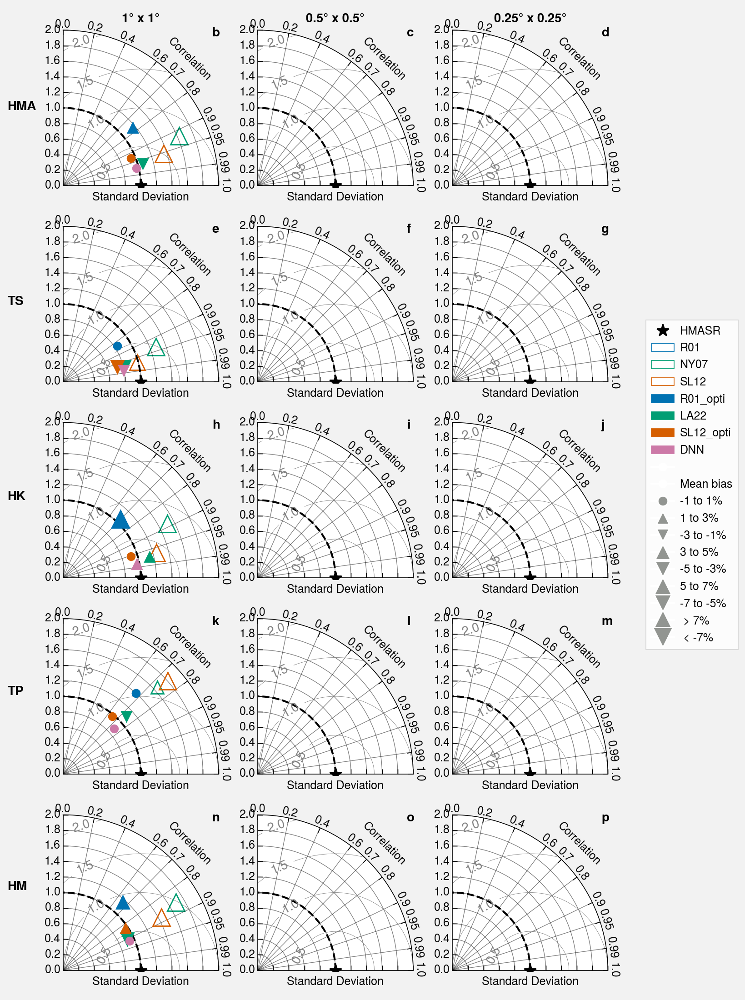

In [497]:
import string 

resolutions = ['1° x 1°', '0.5° x 0.5°', '0.25° x 0.25°']
abc = list(string.ascii_lowercase)
srange = [(0, 1.7), (0, 4.4)]

labels = ['R01', 'NY07', 'SL12','R01_opti', 'LA22', 'SL12_opti', 'DNN']
colors = ['C0', 'C2', 'C1', 'C0', 'C2', 'C1', 'C3']

fig = PLT.figure(figsize=(8.2,11))

k = 1

for zone in zones:
    for resolution in range(3):
        std_ref = df_metrics['val', 'HMASR'].loc[zone, 'std']
        dia = TaylorDiagram(1, fig=fig, rect=(5, 3, k), label='HMASR', srange=(0, 2), extend=False)

        for i, label in enumerate(labels):

            bias = df_metrics['val', label].loc[zone, 'mb']
            if bias > 1:
                marker = '^'
            elif bias < -1:
                marker = 'v'
            else:
                marker = 'o'

            if np.abs(bias) < 1:
                markersize = 6
            elif np.abs(bias) < 3:
                markersize = 8
            elif np.abs(bias) < 5:
                markersize = 10
            elif np.abs(bias) < 7:
                markersize = 12
            else:
                markersize = 14

            if label in ['R01', 'NY07', 'SL12']:
                mfc = 'none'
            else:
                mfc = colors[i]
            
            if resolution == 0:
                dia.add_sample(
                    df_metrics['val', label].loc[zone, 'std']/std_ref, 
                    df_metrics['val', label].loc[zone, 'r'], 
                    marker=marker, markersize=markersize,
                    ms=10, ls='', mfc=mfc, mec=colors[i], label=label, zorder=i
                )

        if zone == 'HMA':
            dia._ax.set_title(resolutions[resolution], fontweight="bold")
            
        dia._ax.text(0.95, 0.95, abc[k], size=10, weight='bold', transform=dia._ax.transAxes)
        dia._ax.axis["left"].toggle(ticklabels=False)
   

        # Add RMS contours, and label them
        contours = dia.add_contours(levels=4, colors='0.5', linewidths=0.3)  # 5 levels in grey
        PLT.clabel(contours, inline=1, fontsize=10, fmt='%.1f')

        # Grid
        dia._ax.grid(lw=0.5, alpha=0.5)
        
        k += 1

from matplotlib.patches import Patch
from matplotlib.lines import Line2D
legend_handles = [dia.samplePoints[0]]
for color, label in zip(colors, labels):
    if label in ['R01', 'NY07', 'SL12']:
        facecolor = 'w'
    else:
        facecolor = color
        
    legend_handles.append(
        Patch(facecolor=facecolor, edgecolor=color, label=label)
    )
    
# Bias
legend_handles.append(Line2D([0], [0], marker='o', color='w', label='',
                      markerfacecolor='w', markersize=6))

legend_handles.append(Line2D([0], [0], marker='o', color='w', label='Mean bias',
                      markerfacecolor='w', markersize=6))

legend_handles.append(Line2D([0], [0], marker='o', color='w', label='-1 to 1%',
                      markerfacecolor='gray', markersize=6+2))

legend_handles.append(Line2D([0], [0], marker='^', color='w', label='1 to 3%',
                      markerfacecolor='gray', markersize=8+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-3 to -1%',
                      markerfacecolor='gray', markersize=8+2))

legend_handles.append(Line2D([0], [0], marker='^', color='w', label='3 to 5%',
                      markerfacecolor='gray', markersize=10+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-5 to -3%',
                      markerfacecolor='gray', markersize=10+2))

legend_handles.append(Line2D([0], [0], marker='^', color='w', label='5 to 7%',
                      markerfacecolor='gray', markersize=12+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-7 to -5%',
                      markerfacecolor='gray', markersize=12+2))

legend_handles.append(Line2D([0], [0], marker='^', color='w', label=' > 7%',
                      markerfacecolor='gray', markersize=14+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label=' < -7%',
                      markerfacecolor='gray', markersize=14+2))
    
    
fig.legend(handles=legend_handles, ncol=1, bbox_to_anchor=(0.99, 0.68))

for zone, y in zip(zones[::-1], np.linspace(0.11, 0.89, len(zones))):
    fig.text(0.01, y, zone, size=10, weight='bold')
        
fig.tight_layout(rect=[0.05, 0, 0.85, 1])
fig.savefig('img/taylor_diagrams_validation.jpg', dpi=300)

# Zoom over some grid cells

In [155]:
import matplotlib.patches as mpatches
import cartopy.crs as ccrs

def plot_gridcell(ax, lat, lon, color):

    ax.add_patch(
        mpatches.Rectangle(
            xy=[lon.start, lat.start],
            width=lon.stop - lon.start,
            height=lat.stop - lat.start,
            transform=ccrs.PlateCarree(),
            fill=False,
            zorder=10,
            color=color,
            linewidth=1,
        )
    )

    return None

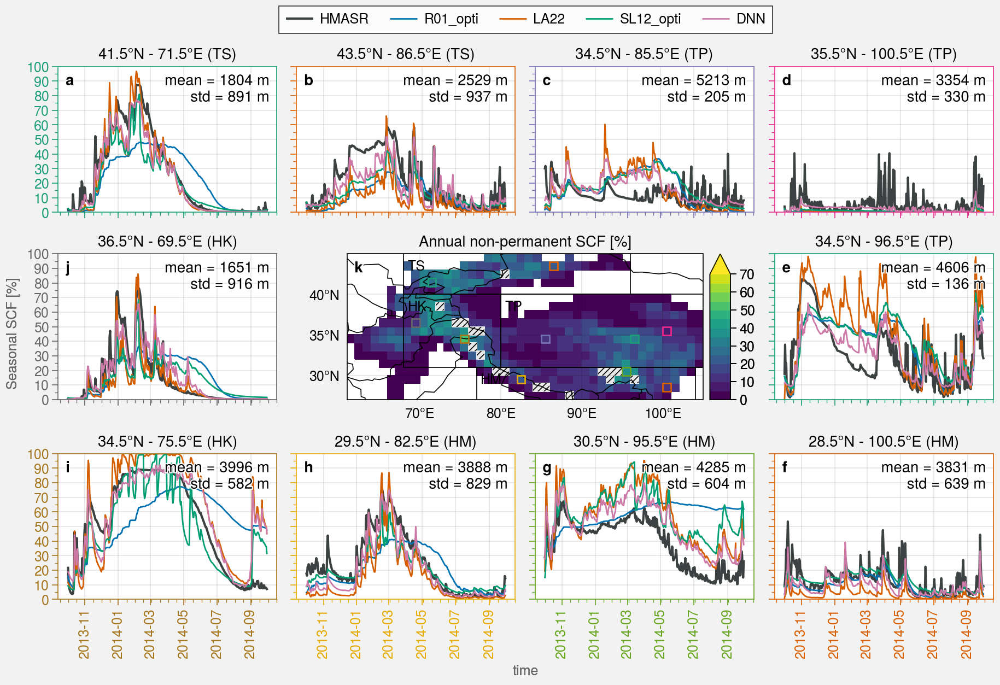

In [156]:
list_scf = [scf, scf_R01_opti, scf_NY07_cust, scf_SL12_opti, scf_DNN]
labels = ['HMASR', 'R01_opti', 'LA22', 'SL12_opti', 'DNN']
colors = ['charcoal gray', ('colorblind', 0), ('colorblind', 1), ('colorblind', 2), ('colorblind', 3)]
linewidths = [1.5, 1, 1, 1, 1]
period = slice('2013-10-01', '2014-09-30')

fig, axs = plot.subplots([[1, 2, 3, 4], [10, 11, 11, 5], [9, 8, 7, 6]], proj=np.insert([None]*10, 10, 'cyl'), aspect=1.5, axwidth=2)

m = axs[10].pcolormesh(u.clim(scf.sel(time=period), freq='D', skipna=True)*100, cmap='viridis', levels=plot.arange(0, 70, 5), extend='max')
axs[10].pcolormesh(mask.where(mask>threshold)*0+1, cmap='lightgray', levels=[0, 1, 2, 3])
plot_hatches_mask(axs[10])

u.plot_zones(ax=axs[10])

axs[10].colorbar(m, space=-0.4)

axs[10].format(
    borders=True, labels=True, latlines=5, latlabels=True,
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    title='Annual non-permanent SCF [%]'
)

lonlats = [[71, 41], [86, 43], [85, 34], [100, 35], [96, 34], [100, 28], [95, 30], [82, 29], [75, 34], [69, 36]]
zone_list = ['TS', 'TS', 'TP', 'TP', 'TP', 'HM', 'HM', 'HM', 'HK', 'HK']
res = 1

plot.rc.cycle = 'Dark2'
color_panels = ['C0', 'C1', 'C2', 'C3', 'C0', 'C1', 'C4', 'C5', 'C6', 'C7']
for i, i_ax in enumerate(range(10)):
     
    h = []    
    for s, label, color, linewidth in zip(list_scf, labels, colors, linewidths):
        m = axs[i_ax].plot(
            s.sel(
                time=period, lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)
            ).weighted(weights).mean(('lat', 'lon'))*100,
            color=color, linewidth=linewidth, label=label
        )
        
        h.append(m)
        
    lat = s[0].sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).lat.values.item(0)
    lon = s[0].sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).lon.values.item(0)
    std_gridcell = topo_std.sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).weighted(weights).mean(('lat', 'lon')).values.item(0)
    mean_gridcell = topo.sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).weighted(weights).mean(('lat', 'lon')).values.item(0)
        
    plot_gridcell(ax=axs[10], lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res), color=color_panels[i])
    axs[i_ax].format(
        ylim=(0, 100), ylocator=10, yminorlocator=5,
        xcolor=color_panels[i], ycolor=color_panels[i],
        ylabel='Seasonal SCF [%]',
        title=str(lat)+'°N - '+str(lon)+'°E ('+zone_list[i]+')',
        urtitle='mean = {:.0f} m'.format(mean_gridcell) +'\nstd = {:.0f} m'.format(std_gridcell)
    )
    
axs.format(abc=True, abcloc='ul')    
fig.legend(h, loc='t', ncol=5)

# fig.save('img/SCF_params_WY2013_grid_points.jpg')

## Refaire la même avec évolution SCF, SD, SWE

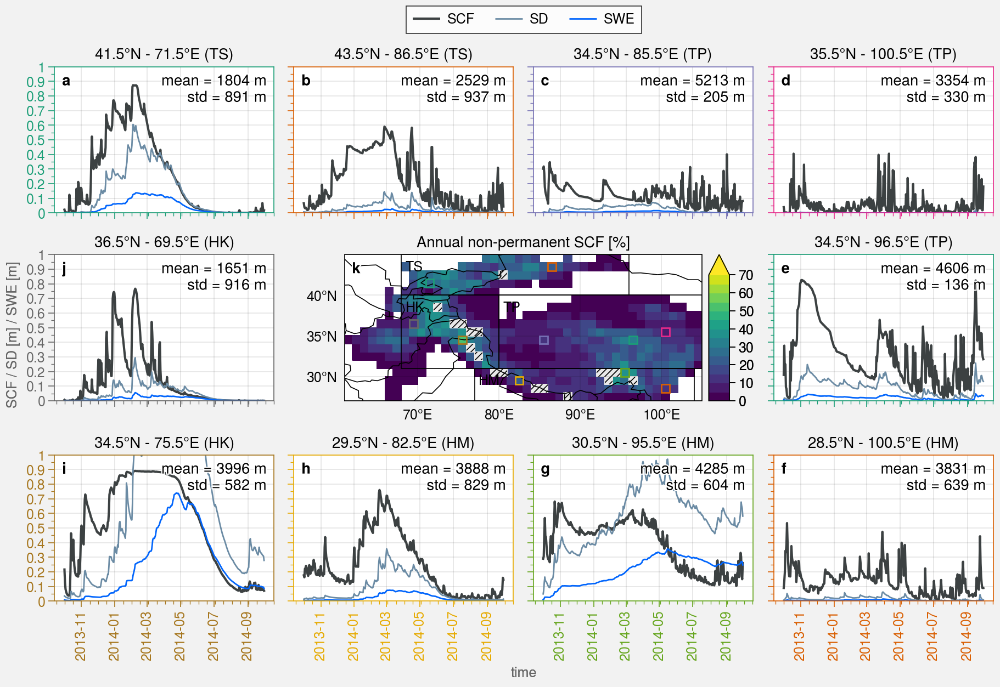

In [145]:
list_scf = [scf, sd, swe]
labels = ['SCF', 'SD', 'SWE']
colors = ['charcoal gray', 'gray blue', 'bright blue']
linewidths = [1.5, 1, 1]
period = slice('2013-10-01', '2014-09-30')

fig, axs = plot.subplots([[1, 2, 3, 4], [10, 11, 11, 5], [9, 8, 7, 6]], proj=np.insert([None]*10, 10, 'cyl'), aspect=1.5, axwidth=2)

m = axs[10].pcolormesh(u.clim(scf.sel(time=period), freq='D', skipna=True)*100, cmap='viridis', levels=plot.arange(0, 70, 5), extend='max')
axs[10].pcolormesh(mask.where(mask>threshold)*0+1, cmap='lightgray', levels=[0, 1, 2, 3])
plot_hatches_mask(axs[10])

u.plot_zones(ax=axs[10])

axs[10].colorbar(m, space=-0.4)

axs[10].format(
    borders=True, labels=True, latlines=5, latlabels=True,
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    title='Annual non-permanent SCF [%]'
)

lonlats = [[71, 41], [86, 43], [85, 34], [100, 35], [96, 34], [100, 28], [95, 30], [82, 29], [75, 34], [69, 36]]
zone_list = ['TS', 'TS', 'TP', 'TP', 'TP', 'HM', 'HM', 'HM', 'HK', 'HK']
res = 1

plot.rc.cycle = 'Dark2'
color_panels = ['C0', 'C1', 'C2', 'C3', 'C0', 'C1', 'C4', 'C5', 'C6', 'C7']
for i, i_ax in enumerate(range(10)):
     
    h = []    
    for da, label, color, linewidth in zip(list_scf, labels, colors, linewidths):
        m = axs[i_ax].plot(
            da.sel(
                time=period, lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)
            ).weighted(weights).mean(('lat', 'lon')),
            color=color, linewidth=linewidth, label=label
        )
        
        h.append(m)
        
    lat = s[0].sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).lat.values.item(0)
    lon = s[0].sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).lon.values.item(0)
    std_gridcell = topo_std.sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).weighted(weights).mean(('lat', 'lon')).values.item(0)
    mean_gridcell = topo.sel(lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res)).weighted(weights).mean(('lat', 'lon')).values.item(0)
        
    plot_gridcell(ax=axs[10], lat=slice(lonlats[i][1], lonlats[i][1]+res), lon=slice(lonlats[i][0], lonlats[i][0]+res), color=color_panels[i])
    axs[i_ax].format(
        ylim=(0, 1), ylocator=0.1, yminorlocator=0.05,
        xcolor=color_panels[i], ycolor=color_panels[i],
        ylabel='SCF / SD [m] / SWE [m]',
        title=str(lat)+'°N - '+str(lon)+'°E ('+zone_list[i]+')',
        urtitle='mean = {:.0f} m'.format(mean_gridcell) +'\nstd = {:.0f} m'.format(std_gridcell)
    )

axs.format(abc=True, abcloc='ul')    
fig.legend(h, loc='t', ncol=5)

fig.save('img/SCF_SD_SWE_WY2013_grid_points.jpg')